# Prediction of Tbilisi real estate price (in november 2020)

I want to make regression model with pricing target where I'll use skills what i have at this moment (oct 2025)  
I think most direct and clear way for this task is using dataset about housing prices or car prices (previously I made some similar projects in learning tasks and few with housing prices in big cities)  
  
Here i dicided to use dataset from Tbilisi becasue:
- This city interesting for me and sometimes I visit it
- It is not so popular for this task in compare with some US, European or Russian cities
- It have some non-standard geographical characteristics  

May be a chose not best dataset for this task but my goal here is just present process of analysis and selection of best model using EDA, data preparation, working with geographical features, feature engineering, pipelines, hyperparams tuning etc.  
Unfortunately in this project there are luck of working with datetime but I use it in another repositories.  
So project goal in this task - prediction of prices

I took next dataset from Kaggle:  
https://www.kaggle.com/datasets/tornikeonoprishvili/tbilisi-housing-challenge-2020  
I also seen some pages with analysis of this data on Kaggle but I didn't read them for independent view of data


# Project structure
- [Introduction](#step_1)
- [Preprocessing and primary EDA](#step_2)
- [Final EDA with preprocessed data](#step_3)
- [Feature engeneering and prepartion data for model selection](#step_4)
- [Model selection](#step_5)
- [Test of best model](#step_6)
- [Example for production](#step_7)

<a id='step_1'></a>
# Introduction

Here is import cell
I going to use first of all pandas and numpy, for visualisation matplotlib, seaborn and plotly, for geographic processes geopandas and h3, for ML process sklearn, tensorflow, boosting models and so some other features

In [1]:
# cell for import of the libraries
import geojson
import geopandas as gpd
import json
import joblib
import h3
import io
import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
import time

from PIL import Image
from shapely import Polygon
from scipy.stats import iqr
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif  
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, PolynomialFeatures, KBinsDiscretizer, OrdinalEncoder, StandardScaler, PowerTransformer


# for have possibility to save plotly images
import kaleido
import plotly.io as pio
pio.renderers.default = "png" 


SEED = 1012
np.random.seed(SEED)

import warnings
warnings.filterwarnings('ignore')   # remove warnings

In [2]:
# open dataset
data = pd.read_csv('01_support_files/housing_clean_2.csv')
data

,Unnamed: 0,price,space,room,bedroom,furniture,latitude,longitude,city_area,floor,max_floor,apartment_type,renovation_type,balcony
0,0,107100,28.00,1,1,0,41.724521,44.753788,Saburtalo District,11,11,new,newly renovated,1
1,2,257000,72.00,3,1,1,41.689502,44.820050,Isani District,15,16,new,newly renovated,0
2,3,157200,53.00,2,1,0,41.677084,44.817222,Krtsanisi District,2,4,new,white frame,1
3,4,237200,80.00,3,2,0,41.682883,44.823815,Krtsanisi District,3,4,new,white frame,1
4,5,158200,60.00,2,1,0,41.768762,44.724123,Saburtalo District,14,16,old,newly renovated,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29199,41658,179200,75.00,2,1,0,41.761308,44.789730,Nadzaladevi District,11,22,construction,green frame,1
29200,41659,126600,53.00,2,1,0,41.731884,44.836876,Other,8,12,new,green frame,1
29201,41660,62400,25.75,1,1,0,41.731884,44.836876,Other,7,12,new,green frame,1
29202,41661,167200,70.00,3,2,0,41.731884,44.836876,Other,4,12,new,green frame,1


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29204 entries, 0 to 29203
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Unnamed: 0       29204 non-null  int64  
 1   price            29204 non-null  int64  
 2   space            29204 non-null  float64
 3   room             29204 non-null  int64  
 4   bedroom          29204 non-null  int64  
 5   furniture        29204 non-null  int64  
 6   latitude         28958 non-null  float64
 7   longitude        28958 non-null  float64
 8   city_area        29204 non-null  object 
 9   floor            29204 non-null  int64  
 10  max_floor        29204 non-null  int64  
 11  apartment_type   29194 non-null  object 
 12  renovation_type  29204 non-null  object 
 13  balcony          29204 non-null  int64  
dtypes: float64(3), int64(8), object(3)
memory usage: 3.1+ MB


So it is relatively clear situation - there are not so much Nones (i think it will be more simple to drop them all but after second view)  
data types looking like clear most of them int, 3 float cols, and 3 odject (i think categorical cols)
Old index ('Unnamed: 0') not monotonic - i think this is a consequence of dataset preparation I will drop it 

In [4]:
# looking with describe
data.describe()

,Unnamed: 0,price,space,room,bedroom,furniture,latitude,longitude,floor,max_floor,balcony
count,29204.000000,2.920400e+04,29204.000000,29204.000000,29204.000000,29204.000000,28958.000000,28958.000000,29204.000000,29204.000000,29204.000000
mean,19711.470894,2.988408e+05,87.569128,2.923298,1.819751,0.430592,41.729477,44.781414,6.361663,10.744556,0.776092
std,12077.748859,1.952151e+06,45.717693,1.050128,0.852494,0.495168,0.051541,0.083022,4.707854,5.454033,0.416868
min,0.000000,3.300000e+03,13.000000,1.000000,0.000000,0.000000,40.469229,38.829869,0.000000,0.000000,0.000000
25%,9367.750000,1.483000e+05,57.000000,2.000000,1.000000,0.000000,41.708101,44.753788,3.000000,7.000000,1.000000
50%,19179.000000,2.142000e+05,75.000000,3.000000,2.000000,0.000000,41.724521,44.772078,5.000000,10.000000,1.000000
75%,29826.250000,3.394000e+05,105.000000,3.000000,2.000000,1.000000,41.734181,44.810649,9.000000,14.000000,1.000000
max,41662.000000,3.295100e+08,530.000000,14.000000,4.000000,1.000000,44.266066,47.238277,127.000000,113.000000,1.000000


In [5]:
# and describe for 'object'
data.describe(include='object')

,city_area,apartment_type,renovation_type
count,29204,29194,29204
unique,11,3,7
top,Saburtalo District,new,newly renovated
freq,11535,19431,19085


I see strange situation in coordinates, something that looks like anomaly in max (and maybe min) prices. Balcony and furniture are obvious binary features, about some features I'm not sure is it better to recognize them as categorical or not (room, bedroom, floor, max_floor). I will research it in next chapter 

<a id='step_2'></a>
# Preprocessing and primary EDA

In [6]:
# drop old index
data = data.drop('Unnamed: 0',axis=1)

In [7]:
# make new id from unique index
data['id'] = data.index

In [8]:
data.columns

Index(['price', 'space', 'room', 'bedroom', 'furniture', 'latitude',
       'longitude', 'city_area', 'floor', 'max_floor', 'apartment_type',
       'renovation_type', 'balcony', 'id'],
      dtype='object')

After first view i suppose that:  

- city_area, apartment_type, renovation_type - are categorical features i'll wath for them last, i'll use value_conts and maybe some visualizations
- furinture and balcony are binary features
- room, and bedroom looking like quantitatve features but with no very large range
- price(target) and space looking like quantitatve features with large range and floor and max_floor - something average  
- lat and lon are geographic features (i see there are strange outliers but want to look on this features in last part using map)  

I'll look om this subgroup separately with different approaches

## price(target), space, floor and max_floor  

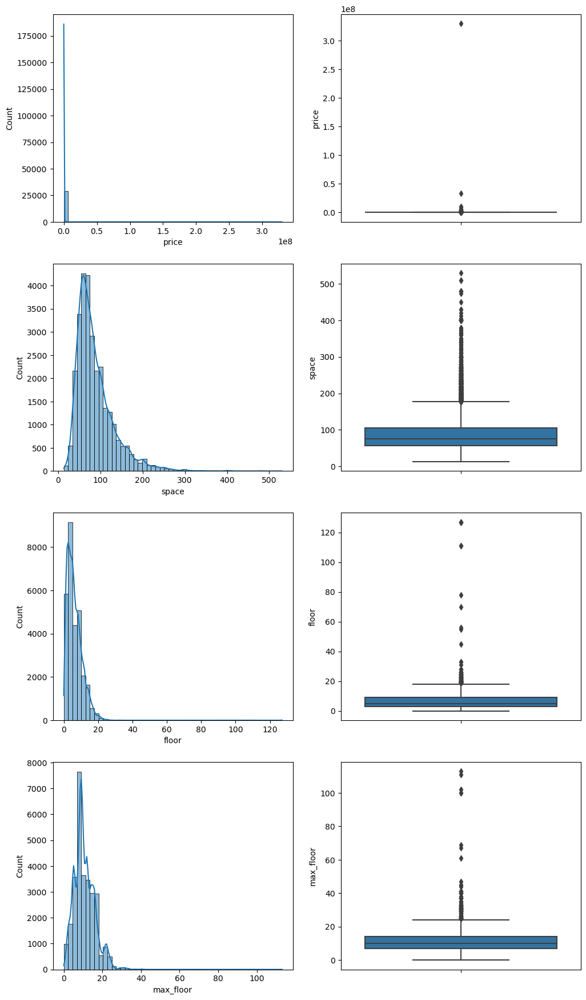

In [9]:
fig, axs = plt.subplots(4, 2)
fig.tight_layout(pad=0.2)  
fig.set_size_inches(10, 18, forward=True)  

for i in range(4):
    rows=i
    sns.histplot(data=data, x=['price', 'space', 'floor', 'max_floor'][i], kde=True, ax=axs[rows, 0], bins=50)
    sns.boxplot(data=data, y=['price', 'space', 'floor', 'max_floor'][i], ax=axs[rows, 1])
    plt.subplots_adjust(hspace=0.2, wspace=0.2)
plt.show()

So i think price has great ouliers I'll look on target separately  
i think other features have significant outliers too, so there are few skyscrappers in Tbilisi but 120 floors is to high moreover max meaninigs of floor higher than max_floor, i think it is normal approach to delete outliers basing on IQR

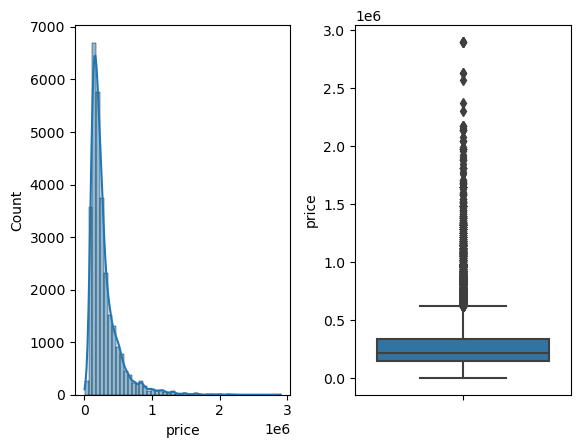

In [10]:
plt.subplot(121)
sns.histplot(data.loc[data['price'] < 3000000]['price'], kde=True, bins=50)
plt.subplot(122)
sns.boxplot(data=data.loc[data['price'] < 3000000], y='price')
plt.subplots_adjust(hspace=0.2, wspace=0.3)
plt.show()

so without one superoutlier it looks more realistic i going to use approach with IQR hear too  
but as price is targe feature it is important to see on lower prices, as i see from plots outliers cleaning basing on IQR won't help with low-price outliers and lowest prices an order of magnitude lower than even 0.25 quantile

In [11]:
#i look to the size of dataset with prices lower than 100000 GEL
data.loc[data['price'] < 100000].shape

(2088, 14)

In [12]:
# so 2100 row it is significant i look for this option
data.loc[data['price'] < 60000].shape

(253, 14)

In [13]:
data.loc[data['price'] < 60000].sort_values(by='price', ascending=True)[:10]

,price,space,room,bedroom,furniture,latitude,longitude,city_area,floor,max_floor,apartment_type,renovation_type,balcony,id
594,3300,51.0,2,1,1,41.682883,44.823815,Krtsanisi District,4,8,new,newly renovated,1,594
27863,3300,50.0,3,1,1,41.751417,44.770875,Vake District,1,2,old,newly renovated,0,27863
1215,3300,73.0,3,2,0,41.760000,44.770679,Didube District,6,6,new,old renovation,0,1215
4167,3660,60.0,3,2,0,41.785002,44.755337,Saburtalo District,9,10,new,newly renovated,1,4167
9087,8600,43.0,2,1,0,41.676111,44.848134,Isani District,5,12,new,white frame,1,9087
8743,10500,30.0,2,1,0,41.683587,44.983057,Other,3,0,construction,black frame,1,8743
25348,11500,97.0,3,2,0,41.795426,44.808609,Gldani District,5,19,new,green frame,1,25348
8726,16500,153.0,5,4,1,41.718341,44.779000,Saburtalo District,2,5,old,old renovation,1,8726
28121,18100,18.0,1,0,0,41.701367,44.768725,Vake District,0,10,new,white frame,0,28121
1201,19800,35.0,1,0,0,41.761308,44.789730,Nadzaladevi District,1,1,old,old renovation,0,1201


so I'm not specialist in Tbilisi house prices but 3300 for 3 rooms flat with space 73 sq.m or 16500 for 5 rooms with space 153 sq.m looking very strange  
it could be just mistakes, or maybe people who sell this object have different indescribable problems but anyway this data are outliers for this task  
i goint to dellete low prices lower than 60000 GEL and some it will not lead to lose all low prices because between 60000 and 0.25 quantile there a lot of objects

about low meanings of other cols (except geography) I think all of this meanings are possible

In [14]:
data.loc[data['price'] < 3000000]['price'].quantile(0.25)

148300.0

In [15]:
# function for cleaning outliers basing on IQR
def outliers_clean(data, outliers_research_cols, iqr_coef=3):   
    for col in outliers_research_cols:
        lower = data[col].quantile(0.25) - iqr_coef * iqr(data[col])
        upper = data[col].quantile(0.75) + iqr_coef * iqr(data[col])
        data = data.loc[data[col] > lower]
        data = data.loc[data[col] < upper]
    data = data.loc[data['price'] > 60000]
    return data

In [16]:
data = outliers_clean(data, ['price', 'space', 'floor', 'max_floor'], iqr_coef=3)
data

,price,space,room,bedroom,furniture,latitude,longitude,city_area,floor,max_floor,apartment_type,renovation_type,balcony,id
0,107100,28.00,1,1,0,41.724521,44.753788,Saburtalo District,11,11,new,newly renovated,1,0
1,257000,72.00,3,1,1,41.689502,44.820050,Isani District,15,16,new,newly renovated,0,1
2,157200,53.00,2,1,0,41.677084,44.817222,Krtsanisi District,2,4,new,white frame,1,2
3,237200,80.00,3,2,0,41.682883,44.823815,Krtsanisi District,3,4,new,white frame,1,3
4,158200,60.00,2,1,0,41.768762,44.724123,Saburtalo District,14,16,old,newly renovated,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29199,179200,75.00,2,1,0,41.761308,44.789730,Nadzaladevi District,11,22,construction,green frame,1,29199
29200,126600,53.00,2,1,0,41.731884,44.836876,Other,8,12,new,green frame,1,29200
29201,62400,25.75,1,1,0,41.731884,44.836876,Other,7,12,new,green frame,1,29201
29202,167200,70.00,3,2,0,41.731884,44.836876,Other,4,12,new,green frame,1,29202


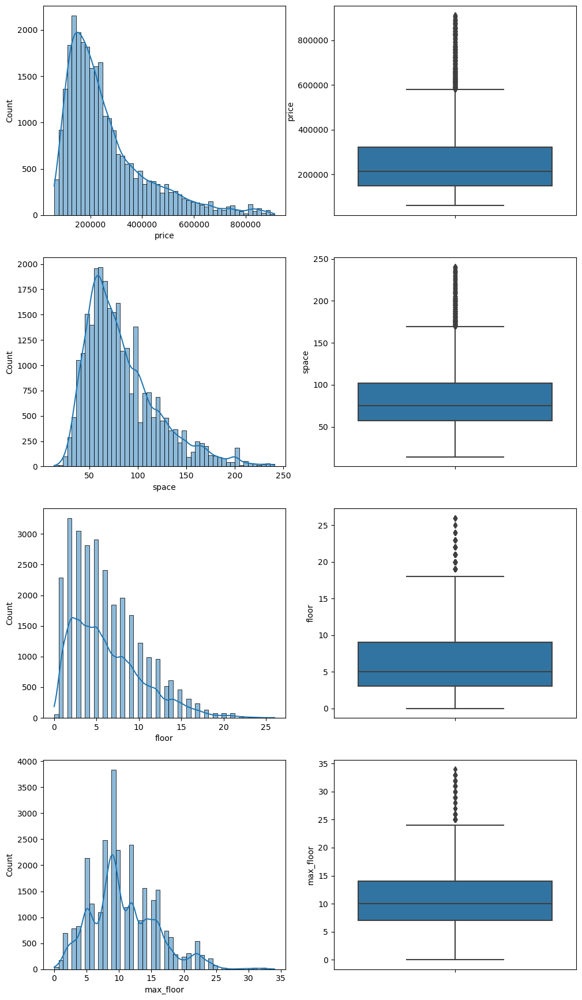

In [17]:
# visualing of cols after cleaning
fig, axs = plt.subplots(4, 2)
fig.tight_layout(pad=0.2)  
fig.set_size_inches(10, 18, forward=True)  

for i in range(4):
    rows=i
    sns.histplot(data=data, x=['price', 'space', 'floor', 'max_floor'][i], kde=True, ax=axs[rows, 0], bins=50)
    sns.boxplot(data=data, y=['price', 'space', 'floor', 'max_floor'][i], ax=axs[rows, 1])
    plt.subplots_adjust(hspace=0.2, wspace=0.2)
plt.show()

In [18]:
data.describe()

,price,space,room,bedroom,furniture,latitude,longitude,floor,max_floor,balcony,id
count,27998.000000,27998.000000,27998.000000,27998.000000,27998.000000,27768.000000,27768.000000,27998.000000,27998.000000,27998.000000,27998.000000
mean,259752.589471,83.887929,2.877384,1.788735,0.429388,41.730020,44.781206,6.296485,10.719730,0.781127,14635.263876
std,157906.391463,37.566137,0.975905,0.816906,0.494998,0.052240,0.084245,4.229208,5.147604,0.413490,8417.756109
min,60200.000000,14.000000,1.000000,0.000000,0.000000,40.469229,38.829869,0.000000,0.000000,0.000000,0.000000
25%,148300.000000,57.000000,2.000000,1.000000,0.000000,41.708101,44.753788,3.000000,7.000000,1.000000,7356.250000
50%,214200.000000,75.000000,3.000000,2.000000,0.000000,41.724521,44.772078,5.000000,10.000000,1.000000,14650.500000
75%,320975.000000,102.000000,3.000000,2.000000,1.000000,41.735656,44.810649,9.000000,14.000000,1.000000,21897.750000
max,911100.000000,240.790000,14.000000,4.000000,1.000000,44.266066,47.238277,26.000000,34.000000,1.000000,29203.000000


i think now 'price', 'space', 'floor', 'max_floor' acceptable for work

## furinture and balcony

In [19]:
data['furniture'].value_counts()

furniture
0    15976
1    12022
Name: count, dtype: int64

In [20]:
data['balcony'].value_counts()

balcony
1    21870
0     6128
Name: count, dtype: int64

I think furniture and balcony acceptable for work

## room, and bedroom 

In [21]:
data['room'].value_counts()

room
3     11445
2      9366
4      4531
5      1261
1      1085
6       237
7        43
8        23
9         3
10        2
12        1
14        1
Name: count, dtype: int64

In [22]:
# looking for max-rooms objects maybe something strange
data.loc[data['room'] > 7]

,price,space,room,bedroom,furniture,latitude,longitude,city_area,floor,max_floor,apartment_type,renovation_type,balcony,id
41,230700,110.0,8,3,0,41.793657,44.821648,Gldani District,6,9,old,old renovation,1,41
662,853400,177.0,8,4,1,41.710881,44.757810,Vake District,1,5,old,newly renovated,0,662
1399,790800,233.0,8,4,1,41.728651,44.766368,Saburtalo District,4,5,new,newly renovated,1,1399
1425,378900,240.0,12,3,1,41.712003,44.804899,Chugureti District,1,2,old,old renovation,1,1425
1482,853400,177.0,8,4,1,41.707792,44.764569,Vake District,1,5,old,newly renovated,0,1482
2266,744700,233.0,8,4,1,41.730969,44.756418,Saburtalo District,4,5,new,newly renovated,0,2266
2670,296600,200.0,9,0,0,41.734181,44.728037,Vake District,10,10,old,not renovated,0,2670
2828,853400,177.0,8,4,1,41.708101,44.769620,Vake District,1,5,old,newly renovated,0,2828
3582,570100,140.0,9,4,1,41.705211,44.790488,Mtatsminda District,1,2,old,old renovation,1,3582
4098,856700,177.0,8,4,1,41.708101,44.769620,Vake District,1,5,old,newly renovated,0,4098


i think it is ok (so i'll drop Nones later) but in general this is possible, cheapest objects have old renovation and I think it is actual for old buildings in 2020

In [23]:
data['bedroom'].value_counts()

bedroom
2    12004
1    10233
3     4448
0      689
4      624
Name: count, dtype: int64

I think room and bedroom are acceptable

## city_area, apartment_type, renovation_type

In [24]:
for i in data.select_dtypes('object').columns.tolist():
    print(data[i].value_counts())
    print()

city_area
Saburtalo District      11289
Vake District            4195
Other                    1964
Didube District          1877
Isani District           1720
Mtatsminda District      1588
Nadzaladevi District     1334
Gldani District          1267
Samgori District         1249
Chugureti District        780
Krtsanisi District        735
Name: count, dtype: int64

apartment_type
new             18565
old              8290
construction     1133
Name: count, dtype: int64

renovation_type
newly renovated     18316
old renovation       3644
white frame          2568
black frame          1254
green frame          1205
not renovated         620
under renovation      391
Name: count, dtype: int64



I have no doubts about city_area (I'll additionaly look on this when I'll look on lat and lon), but I want to look on correspondence between apartment_type and renovation_type: maybe it is possible to make less categories in renovation type maybe it is possible to occur something strange

In [25]:
data.groupby(['apartment_type','renovation_type'])['renovation_type'].agg(['count']).reset_index()

,apartment_type,renovation_type,count
0,construction,black frame,284
1,construction,green frame,353
2,construction,newly renovated,36
3,construction,not renovated,3
4,construction,old renovation,1
5,construction,under renovation,15
6,construction,white frame,441
7,new,black frame,923
8,new,green frame,839
9,new,newly renovated,14072


I see few strange things:
- i understand black frame like abscence of renovation, green frame like renovated, and white frame like something in the middle of them 
- for 'construction' type every "frame" is ok newly renovated is ok too (maybe it will be something better than green frame), about "under renovation" and "not renovated" i understand it as black frame. What is old renovation under construction (one object) is unclear for me - I think it could be black frame too
- about 'new': frames and newly renovated are ok, i think "not renovated" could be black frame and "under renovation" could be white frame, what is "old renovation" here is unclear, but I don't knowexactly what is "new" here - I think in this case "not renovated" is separate category
- about "old" it strange to see frames here (may be they are under renovation) and in this case I think it is possible to join all frames with under_renovation to one category other categories looking naturaly for old buildings 

In [26]:
def renovation_type_correction(data):
    apartment_type = data['apartment_type']
    renovation_type = data['renovation_type']
    if apartment_type == 'construction' and renovation_type in ['under renovation', 'not renovated', 'old renovation']:
        return 'black frame'
    if apartment_type == 'new' and renovation_type == 'not renovated':
        return 'black frame'
    if apartment_type == 'new' and renovation_type == 'under renovation':
        return 'white frame'
    if apartment_type == 'old' and renovation_type in ['black frame', 'white frame', 'green frame']:
        return 'under renovation'
    else:
        return renovation_type

In [27]:
data['renovation_type'] = data.apply(renovation_type_correction, axis=1)

In [28]:
data.groupby(['apartment_type','renovation_type'])['renovation_type'].agg(['count']).reset_index()

,apartment_type,renovation_type,count
0,construction,black frame,303
1,construction,green frame,353
2,construction,newly renovated,36
3,construction,white frame,441
4,new,black frame,988
5,new,green frame,839
6,new,newly renovated,14072
7,new,old renovation,325
8,new,white frame,2341
9,old,newly renovated,4204


I think this categorization is more natural

## Looking for lat and lon features

First I want to look on data on the map

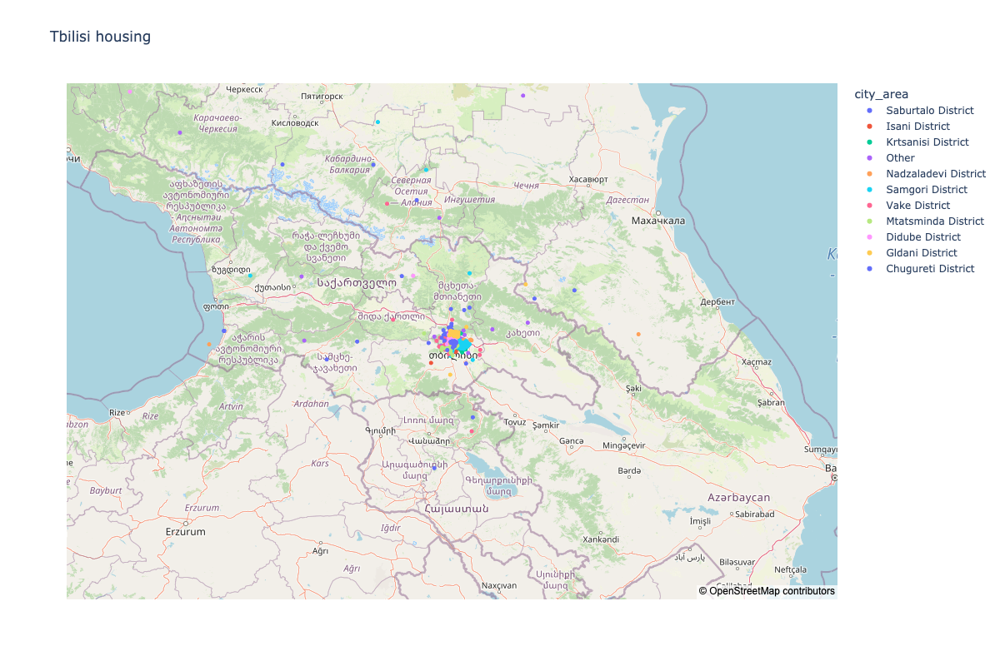

In [29]:
fig = px.scatter_mapbox(data, lat='latitude', lon='longitude', color='city_area',
                     hover_name='city_area', 
                     title='Tbilisi housing', zoom=6, mapbox_style='open-street-map', width = 1200, height=800)
fig.show()

So i think it is strange situation - there are some outliers with lat and lon, there are could be few reasons:
- missing in typing of coordinates
- missing in convertion from minutes to degrees
- confuse lat and lon (as lat and lon meanings in Tbilis are close it could not be very obvious)
- missing only in lat or only in lon

I think there are not so much outliers and it is possble to crop all data outside Tbilisi borders

In [30]:
# I found Tbilisi borders here https://github.com/bumbeishvili/geojson-georgian-regions
tbs = gpd.read_file('../tbs_housing_data/BNDA_GEO_2000-01-01_lastupdate.geojson')
tbs = tbs[tbs.adm1nm == 'Tbilisi (City)']
tbs

,db_c4f0x.hsu_g8ant.salb_geo_bnda_geo_2000_01_01_lastupdate.fid,iso3cd,adm1nm,adm2nm,adm1cd,adm2cd,geometry
73,74,GEO,Tbilisi (City),Area without administration at the 2nd level,GEO012,GEO012XXX,"POLYGON ((44.77447 41.84389, 44.77442 41.84392..."


<Axes: >

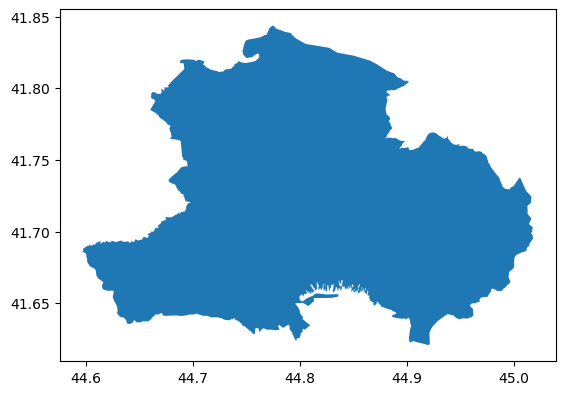

In [31]:
tbs.plot()

I also thought about find map of Tbilisi districts to give more correct names for every city_are but I couldn't find it in internet and it is to long to produce it by myself. But few objects located in Tbilisi Sea area and i produce its boredrs to delete objects in water area

<Axes: >

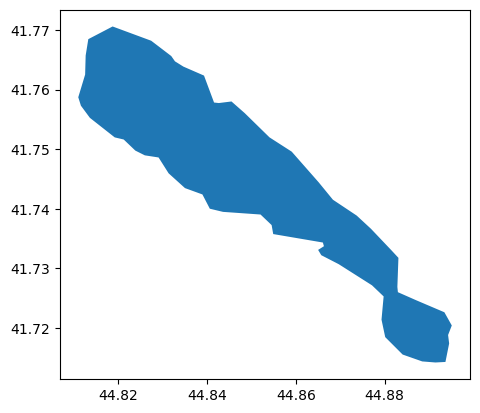

In [32]:
# borders of Tbilisi Sea i produce by myself
lake = gpd.read_file('../tbs_housing_data/tbilisi_tsalsakavi.geojson')
lake.plot()

In [33]:
# perform data to gdf to make overlay operation
data = gpd.GeoDataFrame(data, geometry=gpd.points_from_xy(data.longitude, data.latitude), crs="EPSG:4326")
data.shape

(27998, 15)

(27695, 21)


<Axes: >

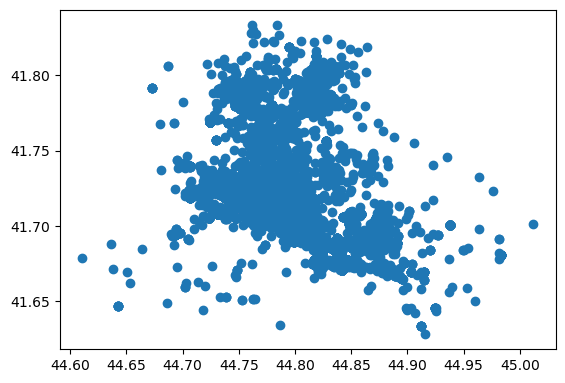

In [34]:
# crop out lat/lon outliers outside of city
data = gpd.overlay(data, tbs, how='intersection')
print(data.shape)
data.plot()

(27646, 21)


<Axes: >

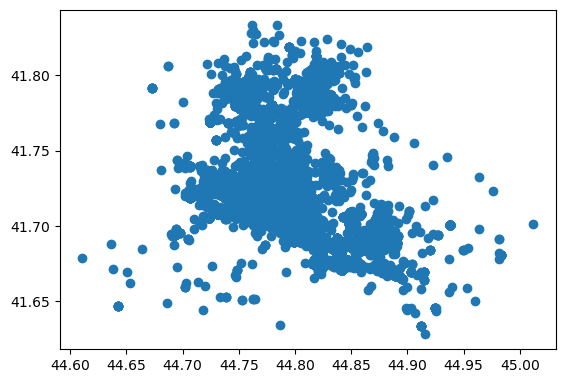

In [35]:
# crop out lat/lon outliers in the lake area
data = gpd.overlay(data, lake, how='difference')
print(data.shape)
data.plot()

In [36]:
data.columns

Index(['price', 'space', 'room', 'bedroom', 'furniture', 'latitude',
       'longitude', 'city_area', 'floor', 'max_floor', 'apartment_type',
       'renovation_type', 'balcony', 'id',
       'db_c4f0x.hsu_g8ant.salb_geo_bnda_geo_2000_01_01_lastupdate.fid',
       'iso3cd', 'adm1nm', 'adm2nm', 'adm1cd', 'adm2cd', 'geometry'],
      dtype='object')

In [37]:
# select needable cols after gpd overlays
data = data[['price', 'space', 'room', 'bedroom', 'furniture', 'latitude',
       'longitude', 'city_area', 'floor', 'max_floor', 'apartment_type',
       'renovation_type', 'balcony', 'id','geometry']]
data.head()

,price,space,room,bedroom,furniture,latitude,longitude,city_area,floor,max_floor,apartment_type,renovation_type,balcony,id,geometry
0,107100,28.0,1,1,0,41.724521,44.753788,Saburtalo District,11,11,new,newly renovated,1,0,POINT (44.75379 41.72452)
1,257000,72.0,3,1,1,41.689502,44.820050,Isani District,15,16,new,newly renovated,0,1,POINT (44.82005 41.68950)
2,157200,53.0,2,1,0,41.677084,44.817222,Krtsanisi District,2,4,new,white frame,1,2,POINT (44.81722 41.67708)
3,237200,80.0,3,2,0,41.682883,44.823815,Krtsanisi District,3,4,new,white frame,1,3,POINT (44.82382 41.68288)
4,158200,60.0,2,1,0,41.768762,44.724123,Saburtalo District,14,16,old,newly renovated,0,4,POINT (44.72412 41.76876)


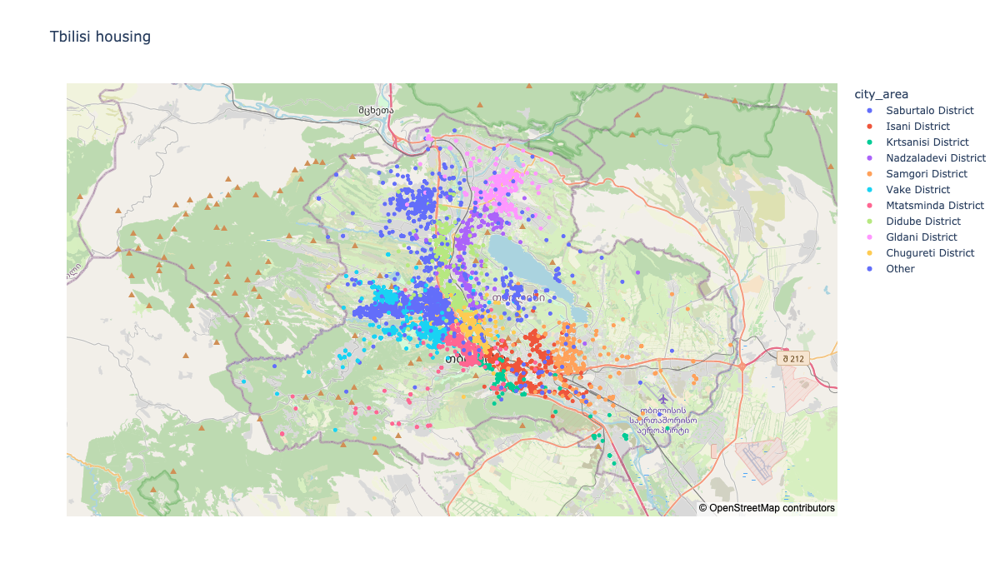

In [38]:
# map after cropping
fig = px.scatter_mapbox(data, lat='latitude', lon='longitude', color='city_area',
                     hover_name='city_area', #size='mag',
                     title='Tbilisi housing', zoom=10, mapbox_style='open-street-map', width=1200, height=700)

fig.write_image("02_Images/01_tbs_realty_map_objects.png")
fig.show()

For now map looking more realistic, so some object have strang classification but I think it is ok to leave authors classification of this objects

In [39]:
# finaly i wnat to chek Nones and duplicates 
data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 27646 entries, 0 to 27645
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   price            27646 non-null  int64   
 1   space            27646 non-null  float64 
 2   room             27646 non-null  int64   
 3   bedroom          27646 non-null  int64   
 4   furniture        27646 non-null  int64   
 5   latitude         27646 non-null  float64 
 6   longitude        27646 non-null  float64 
 7   city_area        27646 non-null  object  
 8   floor            27646 non-null  int64   
 9   max_floor        27646 non-null  int64   
 10  apartment_type   27636 non-null  object  
 11  renovation_type  27646 non-null  object  
 12  balcony          27646 non-null  int64   
 13  id               27646 non-null  int64   
 14  geometry         27646 non-null  geometry
dtypes: float64(3), geometry(1), int64(8), object(3)
memory usage: 3.2+ MB


There are 10 Nones in apartment_type - I think it is not a problem to drop them

In [40]:
data = data.dropna()
print(data.shape)

(27636, 15)


In [41]:
data.duplicated().sum()

0

There are no nans and duplicates after preprocessing

<a id='step_3'></a>
# Final EDA with preprocessed data

Most EDA were perfromed in previous part here I want to finally look on quantitative features and look for the map with h3 cells which I planinng to use in feature engineering

In [42]:
data.columns

Index(['price', 'space', 'room', 'bedroom', 'furniture', 'latitude',
       'longitude', 'city_area', 'floor', 'max_floor', 'apartment_type',
       'renovation_type', 'balcony', 'id', 'geometry'],
      dtype='object')

In [43]:
# price depending by city area
grouped = data.groupby(['city_area'])['price'].agg(['mean','median','max']).reset_index()
grouped

,city_area,mean,median,max
0,Chugureti District,267966.141732,220800.0,889700
1,Didube District,211890.545651,192800.0,757900
2,Gldani District,143562.361331,138400.0,576600
3,Isani District,195751.932084,164800.0,889700
4,Krtsanisi District,250221.506849,214200.0,889700
5,Mtatsminda District,424199.234205,411900.0,911100
6,Nadzaladevi District,166296.495327,163750.0,626100
7,Other,227546.263158,181200.0,889700
8,Saburtalo District,259428.726069,222400.0,906200
9,Samgori District,128565.936740,121900.0,444800


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


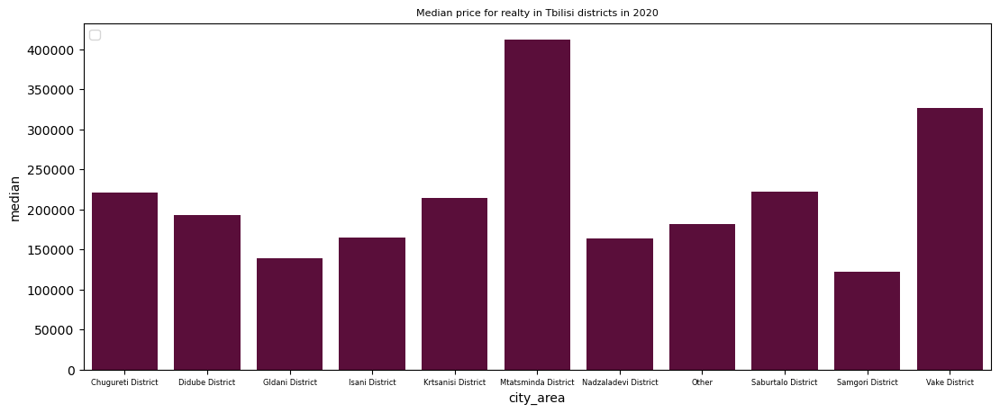

In [44]:
plt.figure(figsize=(13, 5)) 
sns.barplot(data=grouped, x='city_area', y='median', color='#66023C')
plt.legend(loc='upper left')
plt.xticks(fontsize='6')
plt.title('Median price for realty in Tbilisi districts in 2020', fontsize= '8')
plt.savefig('02_Images/02_median_price_distrcts.png')
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


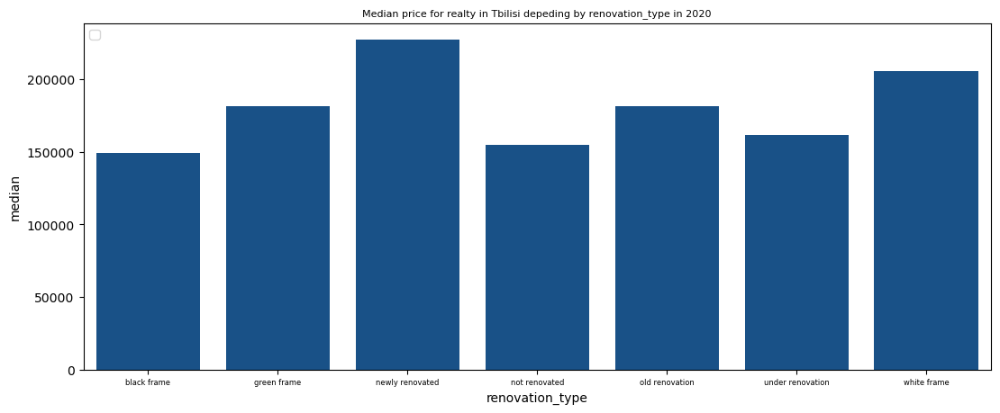

In [45]:
# price depending by renovation_type
grouped = data.groupby(['renovation_type'])['price'].agg(['mean','median','max']).reset_index()
plt.figure(figsize=(13, 5)) 
sns.barplot(data=grouped, x='renovation_type', y='median', color='#075299')
plt.legend(loc='upper left')
plt.xticks(fontsize='6')
plt.title('Median price for realty in Tbilisi depeding by renovation_type in 2020', fontsize= '8')
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


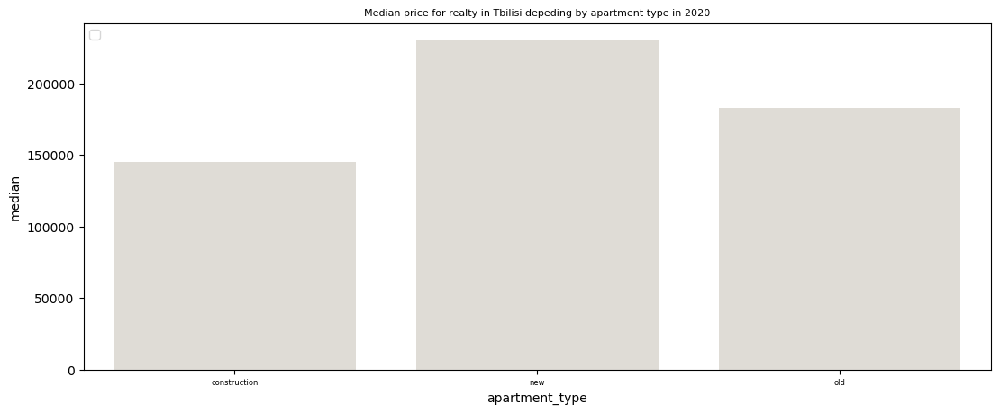

In [46]:
# price depending by apartment_type
grouped = data.groupby(['apartment_type'])['price'].agg(['mean','median','max']).reset_index()
plt.figure(figsize=(13, 5)) 
sns.barplot(data=grouped, x='apartment_type', y='median', color='#e0ddd5')
plt.legend(loc='upper left')
plt.xticks(fontsize='6')
plt.title('Median price for realty in Tbilisi depeding by apartment type in 2020', fontsize= '8')
plt.show()

Vake and Mtatsminda are most expensive, Gldani and Samgori were cheapest (I thought about way to coding categorical features and thout about ordinal encoding but due to similarity of the prices in rest districts I goint to use OHE here)  
About renovation type newly renovated is most expensive options but situation with others is similar to distrcits, now i think about OHE  
In case of apartment type - I think ordinal encoding is acceptable

In [47]:
# group for next visualization (number of objects in district meaning realty type)
grouped = data.groupby(['city_area','renovation_type'])['price'].agg(['count']).reset_index()
grouped

,city_area,renovation_type,count
0,Chugureti District,black frame,13
1,Chugureti District,green frame,10
2,Chugureti District,newly renovated,464
3,Chugureti District,not renovated,44
4,Chugureti District,old renovation,202
...,...,...,...
72,Vake District,newly renovated,2622
73,Vake District,not renovated,66
74,Vake District,old renovation,387
75,Vake District,under renovation,23


In [48]:
grouped = grouped.pivot_table(index='renovation_type', columns='city_area', values='count').T

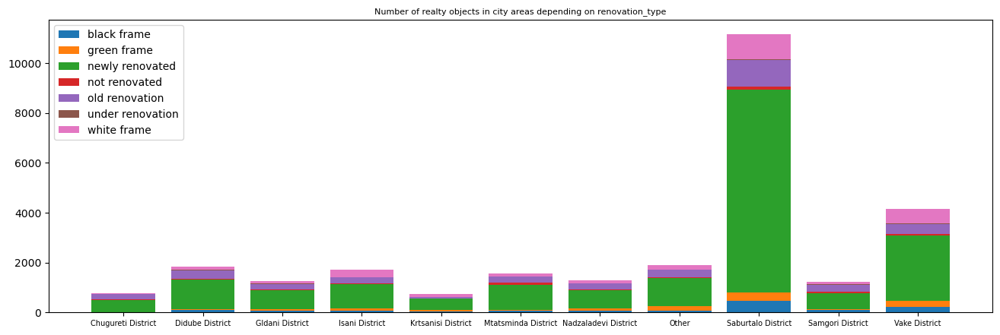

In [49]:
plt.figure(figsize=(16, 5)) 
start = 0
for i in range(len(grouped.columns)):
    if start == 0:
        plt.bar(grouped.index, grouped[grouped.columns[i]], label = grouped.columns[i])
        bottom = grouped[grouped.columns[i]]
        start = 1
    else:
        plt.bar(grouped.index, grouped[grouped.columns[i]], bottom=bottom, label = grouped.columns[i])
        bottom = bottom + grouped[grouped.columns[i]]
        
plt.legend(loc='upper left')
plt.xticks(grouped.index, fontsize='7')
plt.title('Number of realty objects in city areas depending on renovation_type', fontsize= '8')
plt.savefig('02_Images/03_objects_in_districts_renovation_type.png')
plt.show()

In [50]:
grouped = data.groupby(['city_area','apartment_type'])['price'].agg(['count']).reset_index()
grouped = grouped.pivot_table(index='apartment_type', columns='city_area', values='count').T

# there were no buildings under construction in Chugureti
grouped = grouped.fillna(0)
grouped

apartment_type,construction,new,old
city_area,,,
Chugureti District,0.0,218.0,544.0
Didube District,90.0,1038.0,723.0
Gldani District,63.0,755.0,444.0
Isani District,65.0,1162.0,481.0
Krtsanisi District,33.0,544.0,153.0
Mtatsminda District,30.0,763.0,774.0
Nadzaladevi District,133.0,681.0,470.0
Other,139.0,1150.0,611.0
Saburtalo District,272.0,8548.0,2358.0


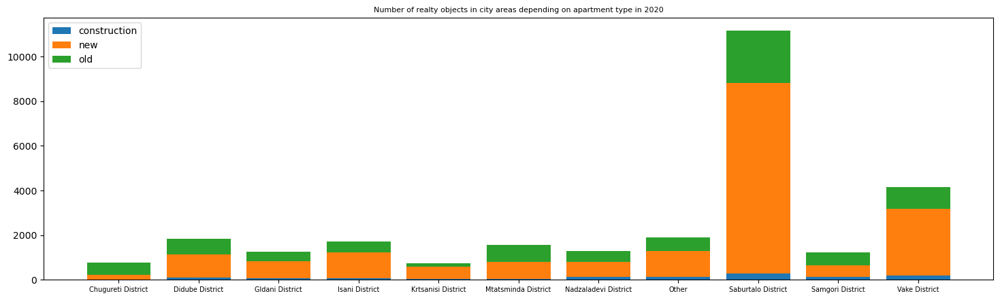

In [51]:
plt.figure(figsize=(18, 5)) 
start = 0
for i in range(len(grouped.columns)):
    if start == 0:
        plt.bar(grouped.index, grouped[grouped.columns[i]], label = grouped.columns[i])
        bottom = grouped[grouped.columns[i]]
        start = 1
    else:
        plt.bar(grouped.index, grouped[grouped.columns[i]], bottom=bottom, label = grouped.columns[i])
        bottom = bottom + grouped[grouped.columns[i]]
        
plt.legend(loc='upper left')
plt.xticks(grouped.index, fontsize='7')
plt.title('Number of realty objects in city areas depending on apartment type in 2020', fontsize= '8')
plt.show()

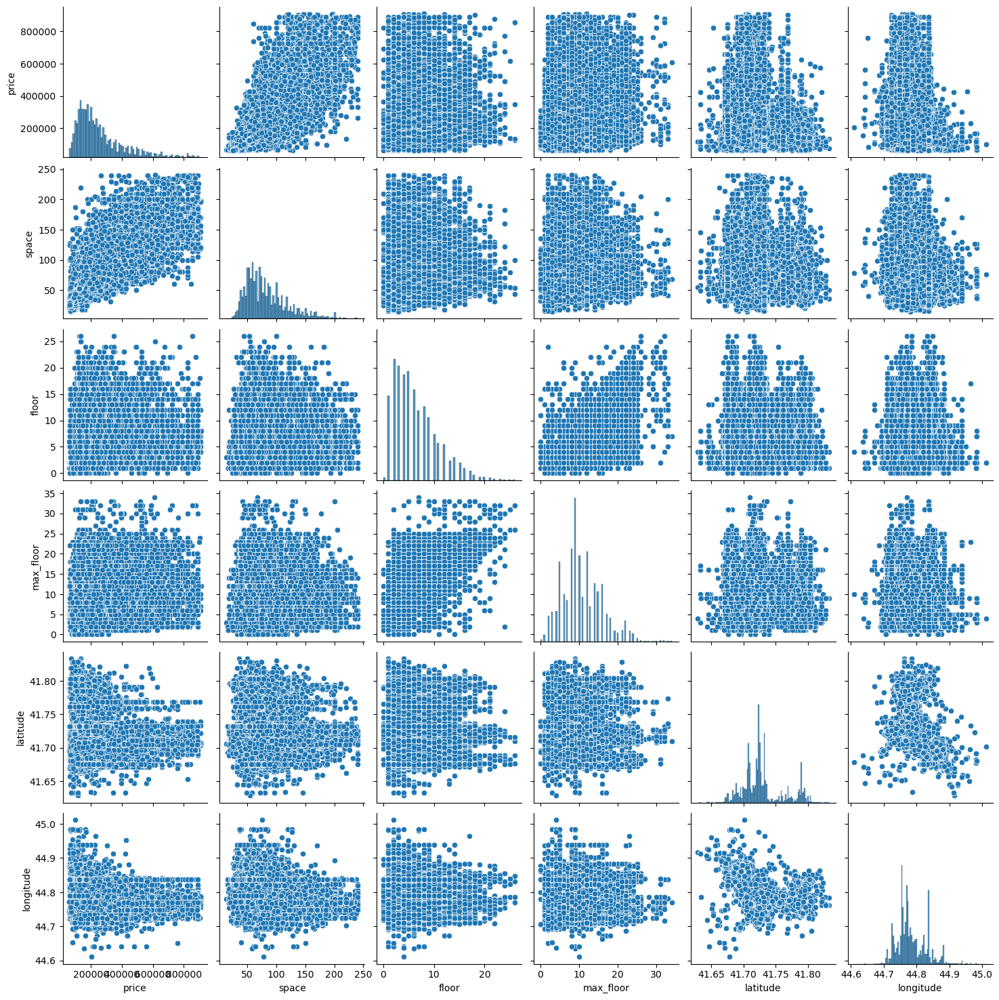

In [52]:
# pairplot for look to distribution and maybe some correlations
sns.pairplot(data[['price', 'space', 'floor', 'max_floor', 'latitude', 'longitude']])

In 2020 Saburtalo was distrcit with largest number of realty objects for sale (and most of them was new and newly renovated)  
Vake was second in that race

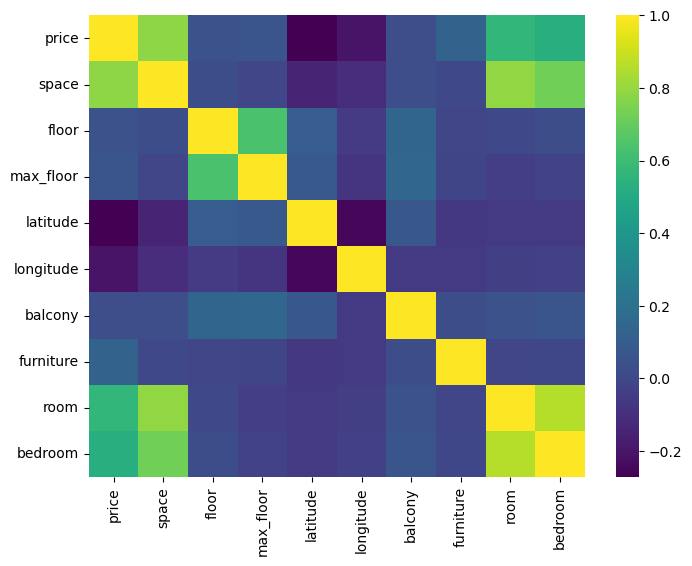

In [53]:
# heatmap of correlations
plt.figure(figsize=(8, 6)) 
sns.heatmap(data[['price', 'space', 'floor', 'max_floor', 'latitude', 'longitude', 'balcony', 'furniture','room','bedroom']].corr(), cmap='viridis')
plt.savefig('02_Images/04_heatmap_feature_corr.png')
plt.show()

It is not surprising that price correlates with space (and also with bedroom and room). Geography has effect too, I'll look on this below with h3 cells

## Visualation with h3 cells

In [54]:
# set sies for h3 and s2 cells (h3: edge length 8.6 km, cell area - 252.9 km^2. s2: edge length 19.5 km, cell area 324.3 km^2)
RES_H3 = 9

In [55]:
# function to take h3-index from coordinates 

def convert_to_h3(lat, lon, res):
    h3_index = h3.geo_to_h3(lat, lon, res) # different functions in different versions, also latlng_to_cell
    return h3_index

def h3_to_table(row):
    lat = row['latitude']
    lon = row['longitude']
    h3_index = convert_to_h3(lat, lon, RES_H3)
    return h3_index

In [56]:
data['h3'] = data.apply(h3_to_table, axis=1)
data.head()

,price,space,room,bedroom,furniture,latitude,longitude,city_area,floor,max_floor,apartment_type,renovation_type,balcony,id,geometry,h3
0,107100,28.0,1,1,0,41.724521,44.753788,Saburtalo District,11,11,new,newly renovated,1,0,POINT (44.75379 41.72452),892c2aab56bffff
1,257000,72.0,3,1,1,41.689502,44.820050,Isani District,15,16,new,newly renovated,0,1,POINT (44.82005 41.68950),892c2aa956bffff
2,157200,53.0,2,1,0,41.677084,44.817222,Krtsanisi District,2,4,new,white frame,1,2,POINT (44.81722 41.67708),892c2aa9003ffff
3,237200,80.0,3,2,0,41.682883,44.823815,Krtsanisi District,3,4,new,white frame,1,3,POINT (44.82382 41.68288),892c2aa9037ffff
4,158200,60.0,2,1,0,41.768762,44.724123,Saburtalo District,14,16,old,newly renovated,0,4,POINT (44.72412 41.76876),892c2aaa457ffff


In [57]:
# hear i group some features on h3 cells to visualize it on map
group_dict = {'price': ['max','mean','median'], 'space':'mean','id':'count','city_area': pd.Series.mode}
grouped = data.groupby(['h3']).agg(group_dict)
grouped.columns = ['price_max','price_mean','price_median','space_mean','number_of_objects_in_cell', 'main_district']
grouped = grouped.reset_index()
print(len(grouped))
grouped

1082


,h3,price_max,price_mean,price_median,space_mean,number_of_objects_in_cell,main_district
0,892c2a064b7ffff,197700,197700.000000,197700.0,115.00,1,Samgori District
1,892c2a06913ffff,62300,62300.000000,62300.0,45.00,1,Krtsanisi District
2,892c2a06917ffff,75800,75800.000000,75800.0,36.00,1,Samgori District
3,892c2a06927ffff,112000,95550.000000,93900.0,60.25,4,Samgori District
4,892c2a0692bffff,84000,84000.000000,84000.0,50.00,1,Krtsanisi District
...,...,...,...,...,...,...,...
1077,892c2ab9b97ffff,207600,207600.000000,207600.0,72.00,1,Vake District
1078,892c2ab9b9bffff,195100,175266.666667,175300.0,71.00,3,Vake District
1079,892c2ab9bcbffff,194400,194400.000000,194400.0,78.00,1,Vake District
1080,892c2ab9d07ffff,367400,367400.000000,367400.0,98.00,1,Saburtalo District


In [58]:
# i tried dfferent variant of change x and y, this is primitive but didn't obtain errors with this approach
grouped['g_reflect'] = grouped['h3'].apply(lambda x: h3.h3_to_geo_boundary(x))   # another variants  cellToBoundary , cell_to_boundary
result_g2 = []
for i in grouped['g_reflect']:
    iter = []
    for a in i:
        int = tuple([a[1], a[0]])
        iter.append(int)
    iter = tuple(iter)
    c = Polygon(iter)
    polygon = Polygon(iter)
    result_g2.append(c)
grouped['geometry'] = result_g2
grouped = grouped.drop('g_reflect', axis=1)
grouped = gpd.GeoDataFrame(grouped, geometry=grouped['geometry'], crs="EPSG:4326")
grouped.head()

,h3,price_max,price_mean,price_median,space_mean,number_of_objects_in_cell,main_district,geometry
0,892c2a064b7ffff,197700,197700.0,197700.0,115.00,1,Samgori District,"POLYGON ((44.78273 41.63337, 44.78447 41.63205..."
1,892c2a06913ffff,62300,62300.0,62300.0,45.00,1,Krtsanisi District,"POLYGON ((44.89488 41.65814, 44.89662 41.65682..."
2,892c2a06917ffff,75800,75800.0,75800.0,36.00,1,Samgori District,"POLYGON ((44.89769 41.66040, 44.89944 41.65908..."
3,892c2a06927ffff,112000,95550.0,93900.0,60.25,4,Samgori District,"POLYGON ((44.91138 41.66321, 44.91312 41.66189..."
4,892c2a0692bffff,84000,84000.0,84000.0,50.00,1,Krtsanisi District,"POLYGON ((44.90976 41.65784, 44.91150 41.65651..."


In [59]:
# before i used folium to represent h3 cells, now i try to use plotly with geojson 
# it is faster and having more simple code but it is needable to obtain "geojson_data" as below

gdf = grouped.drop('main_district',axis=1).reset_index() 

# id col       
gdf['id'] = gdf.index             

# assign 'id' to every GeoJSON feature:
geojson_data = json.loads(gdf.to_json())
for i, feature in enumerate(geojson_data['features']):
    feature['id'] = gdf['id'][i]

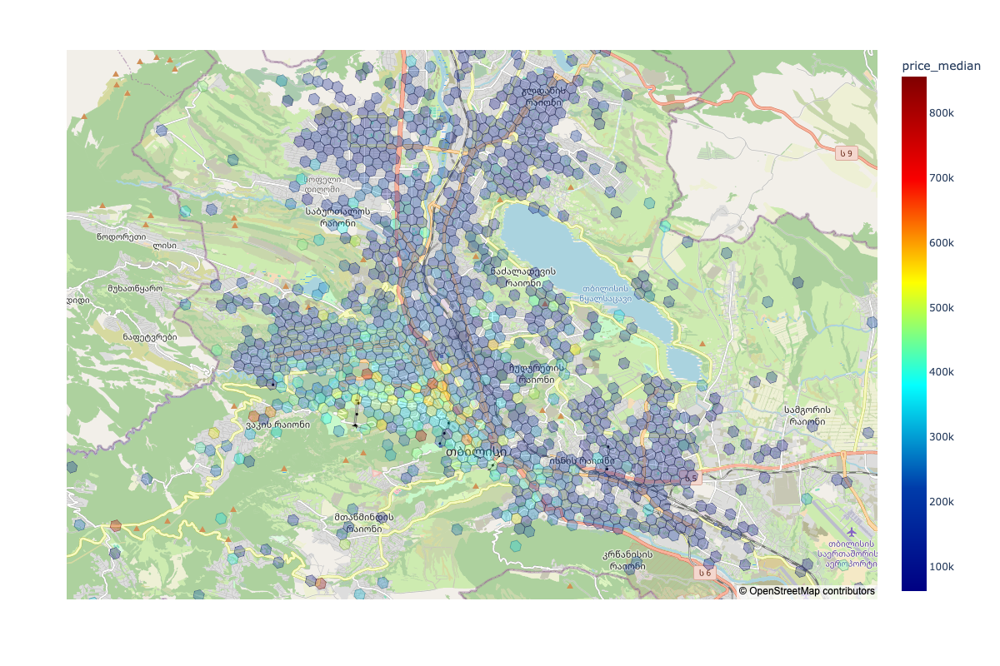

In [60]:
# drawing hexmap with plotly

fig = px.choropleth_mapbox(
    gdf,
    geojson=geojson_data,
    locations="id",
    color="price_median",
    color_continuous_scale = 'Jet',
    mapbox_style="open-street-map",
    center={"lat": gdf.geometry.centroid.y.mean(),
            "lon": gdf.geometry.centroid.x.mean()},
    zoom=11,
    opacity=0.3, width=1200, height=800
)
fig.write_image("02_Images/05_tbs_h3_map_price.png")
fig.show()

In similar tasks center of city is most expensive place but due to the complex structure in case of Tbilisi this point not right in the center. Most expensive (and it is clear from groupby) are Mtatsminda and Vake and i think area between them

<a id='step_4'></a>
# Feature engeneering and prepartion data for model selection

## Adding features from geography
Here i want to add few features based on geography (coordinates, or h3 cells), i want to perform before making features using sklearn and other libraries which i want to make inside pipelines (now I try to make geographic features throw pipelines too but want to leave process where i did it only with functions)
1. First i want to make for each row:
- col with distance to "center of expensive area" - so in similar tasks center of city is optimal place but due to the complex structure in case of Tbilisi this point not right in the center (but near) i take a look on h3 map with median price in cells and decide to take place approximately in center of more expensive area (Mrgvali Baghi)

In [61]:
center_point = pd.DataFrame({'place':'mrgvali_baghi', 'lat': [41.707391], 'lon' :[44.775083]})
center_point = gpd.GeoDataFrame(center_point, geometry=gpd.points_from_xy(center_point.lon, center_point.lat), crs="EPSG:4326")

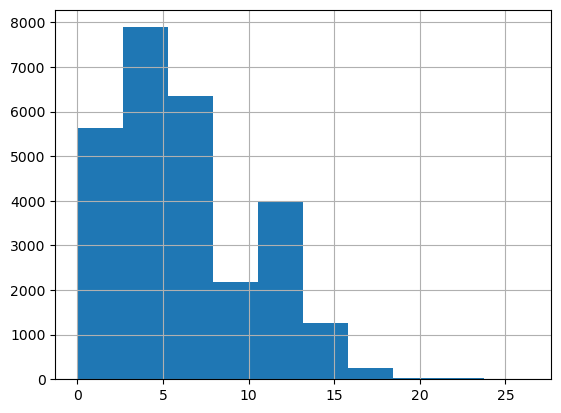

In [62]:
# before i used haversine cosine formula but i thin it is more short to calculate distance with geopandas method with data reprojected to 3857 
data = data.to_crs(3857)
center_point = center_point.to_crs(3857)
data['geometry'].apply(lambda x: x.distance(center_point['geometry'].iloc[0]) / 1000).hist()
# back to 4326
data = data.to_crs(4326)

In [63]:
'''
# but i prefer just in case have that approach in this notebook

def distance_to_center(X):
    # X contain lat and lon
    X = X.to_numpy()

    # point to calculate distances
    lon_center = 37.596411
    lat_center = 55.763666

    # point to radians
    lat_center_rad = math.radians(lat_center)
    lon_center_rad = math.radians(lon_center)

    # data lat and lon to radians 
    lat = np.radians(X[:, 0]) 
    lon = np.radians(X[:, 1])
    
    delta_lat = lat - lat_center_rad
    delta_lon = lon - lon_center_rad
    
    # main formula
    a = np.sin(delta_lat / 2)**2 + np.cos(lat_center_rad) * np.cos(lat) * np.sin(delta_lon / 2)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    
    # Earth radius
    R = 6371000  
    distance = R * c / 1000 
    
    return distance.reshape(-1, 1)
'''

'\n# but i prefer just in case have that approach in this notebook\n\ndef distance_to_center(X):\n    # X contain lat and lon\n    X = X.to_numpy()\n\n    # point to calculate distances\n    lon_center = 37.596411\n    lat_center = 55.763666\n\n    # point to radians\n    lat_center_rad = math.radians(lat_center)\n    lon_center_rad = math.radians(lon_center)\n\n    # data lat and lon to radians \n    lat = np.radians(X[:, 0]) \n    lon = np.radians(X[:, 1])\n    \n    delta_lat = lat - lat_center_rad\n    delta_lon = lon - lon_center_rad\n    \n    # main formula\n    a = np.sin(delta_lat / 2)**2 + np.cos(lat_center_rad) * np.cos(lat) * np.sin(delta_lon / 2)**2\n    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))\n    \n    # Earth radius\n    R = 6371000  \n    distance = R * c / 1000 \n    \n    return distance.reshape(-1, 1)\n'

In [64]:
# I keep versions with functions here but make this process inside the class to use it in pipelines
'''
def h3_around(data):
    sum_list = []
    std_list = []
    mean_list = []
    for a in data['h3']:
        indexes = h3.k_ring(a, 1)
        sum_list.append(grouped.query('h3 in @indexes')['number_of_objects_in_cell'].sum())
        #std_list.append(grouped.query('h3 in @indexes')['number_of_objects'].std())
        mean_list.append(grouped.query('h3 in @indexes')['number_of_objects_in_cell'].mean())
    return pd.Series(sum_list), pd.Series(mean_list)


grouped['h3_ar_sum'], grouped['h3_ar_mean'] = h3_around(grouped)
data = data.merge(grouped[['h3', 'number_of_objects_in_cell','h3_ar_sum','h3_ar_mean']], on='h3', how='left')
data.head()
'''

"\ndef h3_around(data):\n    sum_list = []\n    std_list = []\n    mean_list = []\n    for a in data['h3']:\n        indexes = h3.k_ring(a, 1)\n        sum_list.append(grouped.query('h3 in @indexes')['number_of_objects_in_cell'].sum())\n        #std_list.append(grouped.query('h3 in @indexes')['number_of_objects'].std())\n        mean_list.append(grouped.query('h3 in @indexes')['number_of_objects_in_cell'].mean())\n    return pd.Series(sum_list), pd.Series(mean_list)\n\n\ngrouped['h3_ar_sum'], grouped['h3_ar_mean'] = h3_around(grouped)\ndata = data.merge(grouped[['h3', 'number_of_objects_in_cell','h3_ar_sum','h3_ar_mean']], on='h3', how='left')\ndata.head()\n"

## Make pipeline for preprocessing (encoding, additional features, feature selection)

Here I want construct one pipeline of all procedures before model selection it is not common practice for me and some structures may be to complex, but I hope finally it will work according the plane

In [65]:
data

,price,space,room,bedroom,furniture,latitude,longitude,city_area,floor,max_floor,apartment_type,renovation_type,balcony,id,geometry,h3
0,107100,28.00,1,1,0,41.724521,44.753788,Saburtalo District,11,11,new,newly renovated,1,0,POINT (44.75379 41.72452),892c2aab56bffff
1,257000,72.00,3,1,1,41.689502,44.820050,Isani District,15,16,new,newly renovated,0,1,POINT (44.82005 41.68950),892c2aa956bffff
2,157200,53.00,2,1,0,41.677084,44.817222,Krtsanisi District,2,4,new,white frame,1,2,POINT (44.81722 41.67708),892c2aa9003ffff
3,237200,80.00,3,2,0,41.682883,44.823815,Krtsanisi District,3,4,new,white frame,1,3,POINT (44.82382 41.68288),892c2aa9037ffff
4,158200,60.00,2,1,0,41.768762,44.724123,Saburtalo District,14,16,old,newly renovated,0,4,POINT (44.72412 41.76876),892c2aaa457ffff
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27641,179200,75.00,2,1,0,41.761308,44.789730,Nadzaladevi District,11,22,construction,green frame,1,29199,POINT (44.78973 41.76131),892c2aaa377ffff
27642,126600,53.00,2,1,0,41.731884,44.836876,Other,8,12,new,green frame,1,29200,POINT (44.83688 41.73188),892c2aa839bffff
27643,62400,25.75,1,1,0,41.731884,44.836876,Other,7,12,new,green frame,1,29201,POINT (44.83688 41.73188),892c2aa839bffff
27644,167200,70.00,3,2,0,41.731884,44.836876,Other,4,12,new,green frame,1,29202,POINT (44.83688 41.73188),892c2aa839bffff


In [66]:
data.columns

Index(['price', 'space', 'room', 'bedroom', 'furniture', 'latitude',
       'longitude', 'city_area', 'floor', 'max_floor', 'apartment_type',
       'renovation_type', 'balcony', 'id', 'geometry', 'h3'],
      dtype='object')

In [67]:
cols_for_ohe = ['city_area', 'renovation_type']
cols_for_geographic_features_with_polynomial = ["geometry", 'h3'] # in case of PolynomialTransformer cols without transform will be exist too
cols_for_ordinal = ['apartment_type']
cols_for_just_scaling = ['room', 'bedroom', 'latitude','longitude','max_floor','space','floor'] # in case of other transformer it is needable to repeat 'space','floor' for just scaling
cols_for_k_bins_and_power = ['space','floor']
# furniture and balcony are already like OHE encoded for them I'll set passthrough

In [68]:
# Us i understand FunctionTransforme unacceptable hear and in next case and i need get_feature_names_out method that is why hear and in next case I use classes

class CalcDistanceTransformer(BaseEstimator, TransformerMixin):
#    def __init__(self, center_point):
#        self.center_point = center_point 

    def transform(self, X):
        center_point = pd.DataFrame({'place':'mrgvali_baghi', 'lat': [41.707391], 'lon' :[44.775083]})
        center_point = gpd.GeoDataFrame(center_point, geometry=gpd.points_from_xy(center_point.lon, center_point.lat), crs="EPSG:4326")
        X = X.to_crs(3857)
        center_point = center_point.to_crs(3857)
        X['distance_to_center'] = X['geometry'].apply(lambda x: x.distance(center_point['geometry'].iloc[0]) / 1000)
        print(X['distance_to_center'].shape[0])
       # return np.array(X['distance_to_center']).reshape(1, X['distance_to_center'].shape[0])
        return np.array(X['distance_to_center']).reshape(X['distance_to_center'].shape[0],1)

    def fit(self, X, y=None):
        return self

    def get_feature_names_out(self, input_features=None):
        return ["distance_to_center"]

In [69]:
# In case of using it in another notebook or in .py it is needable to have table 'grouped' so it is possible to obtain this table (with h3) from X but now I want leave this variant

class H3FeaturesTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, grouped):
        self.grouped = grouped 

    def transform(self, X):
        sum_list = []
        mean_list = []
        for a in grouped['h3']:
            indexes = h3.k_ring(a, 1)
            sum_list.append(grouped.query('h3 in @indexes')['number_of_objects_in_cell'].sum())
            mean_list.append(grouped.query('h3 in @indexes')['number_of_objects_in_cell'].mean())
        grouped['h3_ar_sum'] = pd.Series(sum_list)
        grouped['h3_ar_mean'] = pd.Series(mean_list)
        X = X.merge(grouped[['h3', 'number_of_objects_in_cell','h3_ar_sum','h3_ar_mean']], on='h3', how='left')
        return np.array(X[['number_of_objects_in_cell','h3_ar_sum','h3_ar_mean']])#.reshape(X['distance_to_center'].shape[0],1)

    def fit(self, X, y=None):
        return self

    def get_feature_names_out(self, input_features=None):
        return ['number_of_objects_in_cell','h3_ar_sum','h3_ar_mean']

In [70]:
# here is pipline for ordinal features

preprocessor_ord = ColumnTransformer([
    ('cat_ord', OrdinalEncoder(categories = [['construction','old','new']]), ['apartment_type'])])

pipeline_ord = Pipeline(steps=[
    ('ord', preprocessor_ord),  
    ('scaler', StandardScaler())  
])


In [71]:
# here pipeline for geographic features, I add PolynomialFeaturesTransforme for them

preprocessor_geo = ColumnTransformer([
    ("make_distance", CalcDistanceTransformer(), ["geometry"]),
    ('h3_features', H3FeaturesTransformer(grouped), ['h3'])])

pipeline_geo = Pipeline(steps=[
    ('geo', preprocessor_geo),  
    ('poly', PolynomialFeatures(degree=2, include_bias=False)),
    ('pwr', PowerTransformer(method='yeo-johnson')), # var 2
    ('scaler', StandardScaler())  
])

In [72]:
# here pipelines for cols_for_k_bins_and_power

# KBinsDiscretizer
binned_transformer = Pipeline(steps=[
    ('kbins', KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='uniform', subsample=None)),
    ('scaler', StandardScaler())  
])

# PowerTransformer
power_transformer = Pipeline(steps=[
    ('pwr', PowerTransformer(method='yeo-johnson')),
    ('scaler', StandardScaler())  
])

In [73]:
# preprocessor for all data - I can view preprocessed data using it
# but it is not final pipeline, at next step i add feature selection (after data split), and after model tuning I will add best model

common_preprocessor = ColumnTransformer([
    ("geo", pipeline_geo, cols_for_geographic_features_with_polynomial),
    ('ohe', OneHotEncoder(drop='first'), cols_for_ohe),
    ('ord', pipeline_ord, cols_for_ordinal),
    ('num_tr_kb', binned_transformer, cols_for_k_bins_and_power),
    ('num_tr_pw', power_transformer, cols_for_just_scaling), # var 2
    ('just', StandardScaler(), cols_for_just_scaling)
], remainder='passthrough'
)

common_pipeline = Pipeline([
    ("preprocess", common_preprocessor)
])

In [74]:
preproc_df = pd.DataFrame(data=common_pipeline.fit_transform(data), columns=common_pipeline.get_feature_names_out())
print(preproc_df.shape)
print(preproc_df.columns)

27636
(27636, 51)
Index(['geo__make_distance__distance_to_center',
       'geo__h3_features__number_of_objects_in_cell',
       'geo__h3_features__h3_ar_sum', 'geo__h3_features__h3_ar_mean',
       'geo__make_distance__distance_to_center^2',
       'geo__make_distance__distance_to_center h3_features__number_of_objects_in_cell',
       'geo__make_distance__distance_to_center h3_features__h3_ar_sum',
       'geo__make_distance__distance_to_center h3_features__h3_ar_mean',
       'geo__h3_features__number_of_objects_in_cell^2',
       'geo__h3_features__number_of_objects_in_cell h3_features__h3_ar_sum',
       'geo__h3_features__number_of_objects_in_cell h3_features__h3_ar_mean',
       'geo__h3_features__h3_ar_sum^2',
       'geo__h3_features__h3_ar_sum h3_features__h3_ar_mean',
       'geo__h3_features__h3_ar_mean^2', 'ohe__city_area_Didube District',
       'ohe__city_area_Gldani District', 'ohe__city_area_Isani District',
       'ohe__city_area_Krtsanisi District',
       'ohe__city_a

So 44 features (46 without price and id) maybe too much (and after trying of the first iterations of pthe project I watched for the feature importance plot) I think it is ok try to work with 17 feature

## Feature selection

At this step it is time to define features (X) and target (y) tables and make train_test_split

In [75]:
X = data.drop(['price', 'id'], axis=1)
y = data['price']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=SEED)

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(22108, 14)
(22108,)
(5528, 14)
(5528,)


In [76]:
# add Feature selector to pipeline using old column_preprocessor
common_pipeline_ws = Pipeline([
    ("preprocess", common_preprocessor),
    ('selection', SelectKBest(f_classif, k=37))
])

In [77]:
common_pipeline_ws.fit_transform(X_train, y_train)
print(common_pipeline_ws.get_feature_names_out())
X_train_selected = pd.DataFrame(common_pipeline_ws.fit_transform(X_train, y_train), columns=common_pipeline_ws.get_feature_names_out())
X_train_selected

22108
['geo__make_distance__distance_to_center' 'geo__h3_features__h3_ar_sum'
 'geo__h3_features__h3_ar_mean' 'geo__make_distance__distance_to_center^2'
 'geo__h3_features__number_of_objects_in_cell h3_features__h3_ar_sum'
 'geo__h3_features__number_of_objects_in_cell h3_features__h3_ar_mean'
 'geo__h3_features__h3_ar_sum^2'
 'geo__h3_features__h3_ar_sum h3_features__h3_ar_mean'
 'geo__h3_features__h3_ar_mean^2' 'ohe__city_area_Didube District'
 'ohe__city_area_Isani District' 'ohe__city_area_Mtatsminda District'
 'ohe__city_area_Nadzaladevi District' 'ohe__city_area_Saburtalo District'
 'ohe__city_area_Samgori District' 'ohe__city_area_Vake District'
 'ohe__renovation_type_green frame' 'ohe__renovation_type_newly renovated'
 'ohe__renovation_type_white frame' 'ord__cat_ord__apartment_type'
 'num_tr_kb__space' 'num_tr_kb__floor' 'num_tr_pw__room'
 'num_tr_pw__bedroom' 'num_tr_pw__latitude' 'num_tr_pw__longitude'
 'num_tr_pw__max_floor' 'num_tr_pw__space' 'num_tr_pw__floor' 'just__room'

,geo__make_distance__distance_to_center,geo__h3_features__h3_ar_sum,geo__h3_features__h3_ar_mean,geo__make_distance__distance_to_center^2,geo__h3_features__number_of_objects_in_cell h3_features__h3_ar_sum,geo__h3_features__number_of_objects_in_cell h3_features__h3_ar_mean,geo__h3_features__h3_ar_sum^2,geo__h3_features__h3_ar_sum h3_features__h3_ar_mean,geo__h3_features__h3_ar_mean^2,ohe__city_area_Didube District,...,num_tr_pw__space,num_tr_pw__floor,just__room,just__bedroom,just__latitude,just__longitude,just__max_floor,just__space,just__floor,remainder__furniture
0,-0.064131,0.046744,0.249415,-0.052309,-0.120688,-0.038569,0.044216,0.139676,0.243626,0.0,...,-0.681386,0.607088,-0.901561,-0.965640,-0.588019,-1.263401,0.632764,-0.715224,0.401244,1.0
1,0.072380,-1.164792,-0.707330,0.086644,-0.813164,-0.585976,-1.160003,-0.957367,-0.702608,0.0,...,1.200788,-0.089384,1.160269,0.260503,-0.737383,-1.380424,-0.920658,1.174364,-0.309398,1.0
2,0.415337,-0.553004,-0.543137,0.431332,-0.326768,-0.316465,-0.552884,-0.553207,-0.540634,0.0,...,-1.658950,-0.089384,-0.901561,-0.965640,0.823569,-0.371988,-0.338125,-1.207582,-0.309398,1.0
3,-0.434021,-0.488120,-0.597577,-0.434060,-0.154669,-0.196997,-0.488399,-0.545871,-0.594335,0.0,...,-0.400818,-1.186622,-0.901561,-0.965640,-0.097875,0.409525,-0.726480,-0.528927,-1.020040,1.0
4,-0.416177,-0.111345,-0.205042,-0.415471,-0.354321,-0.399660,-0.113413,-0.165150,-0.206859,0.0,...,0.351468,-0.389084,0.129354,-0.965640,-0.220471,-0.860155,2.186186,0.109807,-0.546279,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22103,0.102630,0.291960,0.197557,0.117297,0.396005,0.351973,0.289072,0.237478,0.192073,0.0,...,-0.186294,0.795072,0.129354,0.260503,-0.080003,-1.249909,0.438586,-0.369243,0.638125,1.0
22104,0.530336,1.278030,1.444843,0.545588,1.516892,1.578827,1.278071,1.385007,1.446031,0.0,...,0.861916,0.607088,1.160269,1.486645,0.085140,1.289839,-0.338125,0.695313,0.401244,0.0
22105,-0.847994,-0.348495,-0.450206,-0.868997,-0.068983,-0.110630,-0.349546,-0.404227,-0.448952,0.0,...,0.645570,-1.777775,0.129354,0.260503,-1.024534,0.276277,-1.697369,0.429174,-1.256921,1.0
22106,1.248435,-1.657115,-1.815602,1.246208,-1.678734,-1.753757,-1.649027,-1.721761,-1.811983,0.0,...,-1.438615,1.546715,-0.901561,-0.965640,1.513647,0.973484,0.826942,-1.114433,1.822529,0.0


<a id='step_5'></a>
# Model selection

In [78]:
# imports fo ml part

import lightgbm as lgb  
import optuna
import xgboost as xgb

from lightgbm import LGBMRegressor   
from sklearn import linear_model
from sklearn import tree
from sklearn.dummy import DummyRegressor
from sklearn.ensemble import RandomForestRegressor 
from sklearn.inspection import permutation_importance
from sklearn.linear_model import LinearRegression  
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, r2_score
from sklearn.model_selection import cross_val_score, train_test_split, RandomizedSearchCV
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor 
from xgboost import XGBRegressor   

# tensorflow
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import Conv2D, Flatten, Dense, AvgPool2D, MaxPooling2D, GlobalAveragePooling2D
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam

In [79]:
models = []

In [80]:
%%time
# cross-validaion for LinearRegression
model_linear = LinearRegression()      

scores = cross_val_score(model_linear, X_train_selected, y_train, cv=5, scoring='neg_mean_absolute_percentage_error')   
model_linear.fit(X_train_selected,y_train)
models.append(model_linear)
final_score = scores.mean()                                                 
print(scores)
print('Average score:', final_score)

[-0.21201776 -0.21284112 -0.20884969 -0.21850114 -0.21085592]
Average score: -0.21261312549139894
CPU times: user 10.4 s, sys: 403 ms, total: 10.8 s
Wall time: 1.45 s


In [81]:
clf = linear_model.Lasso(random_state=SEED)
parametrs = {'alpha': np.arange(0, 5, 0.001),
            'selection': ['cyclic', 'random']}

random_cv = RandomizedSearchCV(estimator=clf,
    param_distributions=parametrs,
    cv=5, n_iter=50, 
    scoring = 'neg_mean_absolute_percentage_error',
    n_jobs = -1, verbose = 0, 
    return_train_score = True,
    random_state=SEED)

random_cv.fit(X_train_selected, y_train)

best_lasso = random_cv.best_estimator_
models.append(best_lasso)
print(best_lasso)

best_lasso_score = random_cv.best_score_
print(best_lasso_score)

/Users/vladkozlovskiy/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.526e+13, tolerance: 4.392e+10
  model = cd_fast.enet_coordinate_descent(
/Users/vladkozlovskiy/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.467e+13, tolerance: 4.491e+10
  model = cd_fast.enet_coordinate_descent(
/Users/vladkozlovskiy/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider incre

Lasso(alpha=4.723, random_state=1012)
-0.21241834779390317


In [82]:
clf = Ridge(random_state=SEED)
parametrs = {'alpha': np.arange(0, 5, 0.001),
            'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga', 'lbfgs']}

random_cv = RandomizedSearchCV(estimator=clf,
    param_distributions=parametrs,
    cv=5, n_iter=50, 
    scoring = 'neg_mean_absolute_percentage_error',
    n_jobs = -1, verbose = 0, 
    return_train_score = True,
    random_state=SEED)

random_cv.fit(X_train_selected, y_train)

best_ridge = random_cv.best_estimator_
print(best_ridge)
models.append(best_ridge)

best_ridge_score = random_cv.best_score_
print(best_ridge_score)

/Users/vladkozlovskiy/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/vladkozlovskiy/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/vladkozlovskiy/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/vladkozlovskiy/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/vladkozlovskiy/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/vladkozlovski

Ridge(alpha=4.432, random_state=1012, solver='cholesky')
-0.21230830555662467


/Users/vladkozlovskiy/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


In [83]:
clf = SVR()
parametrs = {'kernel': ['linear', 'rbf'],
             'degree' : [2,3,5],
             'gamma': ['scale', 1e-4, 1e-3, 0.01, 0.1, 10],
             'C': [1, 10, 100]}

random_cv = RandomizedSearchCV(estimator=clf,
    param_distributions=parametrs,
    cv=3, n_iter=5, 
    scoring = 'neg_mean_absolute_percentage_error',
    n_jobs = -1, verbose = 0, 
    return_train_score = True,
    random_state=SEED)

random_cv.fit(X_train_selected, y_train)

best_SVR = random_cv.best_estimator_
print(best_SVR)
models.append(best_SVR)
best_SVR_score = random_cv.best_score_
print(best_SVR_score)

SVR(C=100, degree=5, gamma=0.01, kernel='linear')
-0.19236692934786428


In [84]:
clf = KNeighborsRegressor()
parametrs = {'n_neighbors' : range(1,100,2),
             'leaf_size' : [10, 30, 50, 100, 200, 400],
             'algorithm' : ["auto",  "ball_tree", "kd_tree", "brute"]}

random_cv = RandomizedSearchCV(estimator=clf,
    param_distributions=parametrs,
    cv=5, n_iter=50, 
    scoring = 'neg_mean_absolute_percentage_error',
    n_jobs = -1, verbose = 0, 
    return_train_score = True,
    random_state=SEED)

random_cv.fit(X_train_selected, y_train)

best_knn = random_cv.best_estimator_
print(best_knn)
models.append(best_knn)
best_knn_score = random_cv.best_score_
print(best_knn_score)

KNeighborsRegressor(algorithm='brute', leaf_size=200)
-0.17758716434993807


In [85]:
print(best_SVR_score)
print(best_knn_score)

-0.19236692934786428
-0.17758716434993807


In [86]:
clf = DecisionTreeRegressor(random_state=SEED)
parametrs = { 'max_depth': range(1, 50, 1),
             'min_samples_split':range(1, 50, 1),
             'min_samples_leaf':range(1, 50, 1)}

random_cv = RandomizedSearchCV(estimator=clf,
    param_distributions=parametrs,
    cv=5, n_iter=50, 
    scoring = 'neg_mean_absolute_percentage_error',
    n_jobs = -1, verbose = 0, 
    return_train_score = True,
    random_state=SEED)

random_cv.fit(X_train_selected, y_train)

best_tree = random_cv.best_estimator_
best_tree
models.append(best_tree)
best_tree_score = random_cv.best_score_
best_tree_score

-0.16557747938647394

In [87]:
clf = RandomForestRegressor(random_state=SEED)
parametrs = {'max_depth': range (1, 50, 2),
            'n_estimators': range (1, 50, 2),
            'min_samples_split':range(1, 50, 1),
            'min_samples_leaf':range(1, 50, 1)}

random_cv = RandomizedSearchCV(estimator=clf,
    param_distributions=parametrs,
    cv=5, n_iter=50, 
    scoring = 'neg_mean_absolute_percentage_error',
    n_jobs = -1, verbose = 0, 
    return_train_score = True,
    random_state=SEED)

random_cv.fit(X_train_selected, y_train)

best_forest = random_cv.best_estimator_
best_forest
models.append(best_forest)
best_forest_score = random_cv.best_score_
best_forest_score

-0.1467401885948894

In [88]:
print(best_forest_score)

-0.1467401885948894


In [89]:
# params for boosting models
num_leaves = [10, 50, 100, 200, 300, 400, 500, 700, 1000]
min_child_samples = [10, 20, 50, 100, 200, 400, 1000]
n_estimators = [10, 50, 100, 200, 300, 400, 500, 700, 1000]
learning_rate = [1.0, 0.5, 0.1, 0.05, 0.01, 0.005, 0.001, 0.0005, 0.0001]

hyperparameter_grid = {'n_estimators': n_estimators,
    'num_leaves': num_leaves,
    'min_child_samples': min_child_samples,
    'learning_rate': learning_rate}

model_lgbm = LGBMRegressor(random_state=SEED) 

random_cv = RandomizedSearchCV(estimator=model_lgbm,
    param_distributions=hyperparameter_grid,
    cv=5, n_iter=50, 
    scoring = 'neg_mean_absolute_percentage_error',
    n_jobs = -1, verbose = 0, 
    return_train_score = True,
    random_state=SEED)

random_cv.fit(X_train_selected, y_train)

lgbm_best_model = random_cv.best_estimator_
lgbm_best_model
models.append(lgbm_best_model)
lgbm_best_score = random_cv.best_score_
lgbm_best_score

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003922 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3437
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004090 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3422
[LightGBM] [Info] Auto-choosing col-wise multi-t

-0.1334300351146509

In [90]:
clf_xgb = xgb.XGBRegressor()
# same params for LightGBM

random_cv = RandomizedSearchCV(estimator=clf_xgb,
    param_distributions=hyperparameter_grid,
    cv=5, n_iter=50, 
    scoring = 'neg_mean_absolute_percentage_error',
    n_jobs = -1, verbose = 0, 
    return_train_score = True,
    random_state=SEED)

random_cv.fit(X_train_selected, y_train)

best_xgb = random_cv.best_estimator_
best_xgb
models.append(best_xgb)
best_xgb_score = random_cv.best_score_
best_xgb_score

[23:25:40] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "min_child_samples", "num_leaves" } are not used.

[23:25:40] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "min_child_samples", "num_leaves" } are not used.

[23:25:40] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "min_child_samples", "num_leaves" } are not used.

[23:25:40] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "min_child_samples", "num_leaves" } are not used.

[23:25:40] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "min_child_samples", "num_leave

-0.13628689568206895

### Tensoflow block

In [91]:
# select the best structure of the net with Optuna

def objective(trial):
    model = Sequential()
    # number of input features
    input_dim = X_train_selected.shape[1]
    
    # suggest the number of layers
    n_layers = trial.suggest_int('n_layers', 1, 12)
    
    # create the first layer with the input dimension
    units = trial.suggest_int('units_l0', 32, 576, step=32)
    activation = trial.suggest_categorical('activation_l0', ['relu', 'tanh'])
    model.add(Dense(units=units, activation=activation, input_dim=input_dim))
    
    # add additional layers based on the suggestion
    for i in range(1, n_layers):
        units = trial.suggest_int(f'units_l{i}', 32, 576, step=32)
        activation = trial.suggest_categorical(f'activation_l{i}', ['relu', 'tanh'])
        model.add(Dense(units=units, activation=activation))
    
    # add the output layer
    model.add(Dense(1))
    
    # compile the model
    learning_rate = trial.suggest_loguniform('learning_rate', 1e-5, 1e-1)
    model.compile(optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=learning_rate), loss='mae', metrics=['mape'])
    
    # fit the model
    history = model.fit(X_train_selected, y_train, validation_split=0.2, epochs=50, verbose=0)
    
    # get the best validation mean absolute error
    val_mae = min(history.history['mape'])
    return val_mae

# create the study and optimize the objective function
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=30)

# the best trial's parameters
print(f"Best trial: {study.best_trial.params}")

[I 2025-10-29 23:32:46,292] A new study created in memory with name: no-name-d03bb59e-5fa2-4026-b389-63b7f3d44372
[I 2025-10-29 23:33:37,263] Trial 0 finished with value: 39.59184646606445 and parameters: {'n_layers': 6, 'units_l0': 128, 'activation_l0': 'relu', 'units_l1': 64, 'activation_l1': 'relu', 'units_l2': 224, 'activation_l2': 'relu', 'units_l3': 416, 'activation_l3': 'tanh', 'units_l4': 288, 'activation_l4': 'relu', 'units_l5': 544, 'activation_l5': 'tanh', 'learning_rate': 0.06746192346986175}. Best is trial 0 with value: 39.59184646606445.
[I 2025-10-29 23:35:17,983] Trial 1 finished with value: 45.541954040527344 and parameters: {'n_layers': 12, 'units_l0': 96, 'activation_l0': 'relu', 'units_l1': 384, 'activation_l1': 'relu', 'units_l2': 576, 'activation_l2': 'tanh', 'units_l3': 544, 'activation_l3': 'tanh', 'units_l4': 160, 'activation_l4': 'tanh', 'units_l5': 288, 'activation_l5': 'relu', 'units_l6': 32, 'activation_l6': 'relu', 'units_l7': 384, 'activation_l7': 'relu',

Best trial: {'n_layers': 8, 'units_l0': 576, 'activation_l0': 'tanh', 'units_l1': 576, 'activation_l1': 'tanh', 'units_l2': 32, 'activation_l2': 'tanh', 'units_l3': 128, 'activation_l3': 'relu', 'units_l4': 576, 'activation_l4': 'relu', 'units_l5': 160, 'activation_l5': 'tanh', 'units_l6': 256, 'activation_l6': 'tanh', 'units_l7': 576, 'activation_l7': 'relu', 'learning_rate': 0.0003539406530915395}


In [92]:
print(study.best_trial.params)

{'n_layers': 8, 'units_l0': 576, 'activation_l0': 'tanh', 'units_l1': 576, 'activation_l1': 'tanh', 'units_l2': 32, 'activation_l2': 'tanh', 'units_l3': 128, 'activation_l3': 'relu', 'units_l4': 576, 'activation_l4': 'relu', 'units_l5': 160, 'activation_l5': 'tanh', 'units_l6': 256, 'activation_l6': 'tanh', 'units_l7': 576, 'activation_l7': 'relu', 'learning_rate': 0.0003539406530915395}


In [93]:
best_params = study.best_trial.params

In [94]:
def build_model():
    model = keras.Sequential()
    # first layer
    model.add(Dense(units=best_params['units_l0'], activation=best_params['activation_l0'], input_dim=X_train_selected.shape[1]))

    # add layers based on the best trial
    for _ in range(1, best_params['n_layers']):
        model.add(layers.Dense(best_params['units_l'+str(_)], activation=best_params['activation_l'+str(_)]))
    
    # output layer
    model.add(layers.Dense(1))  

    # compile model
    model.compile(
        optimizer=tf.keras.optimizers.legacy.Adam(learning_rate=best_params['learning_rate']),
        loss="mae",
        metrics=["mape"],
    )
    return model

In [95]:
sequential_model = build_model()

In [96]:
early_stopping = EarlyStopping(monitor='val_mape',  
                               patience=50,          
                               verbose=0,
                               restore_best_weights=True)

history = sequential_model.fit(X_train_selected, y_train, verbose=1, epochs=1000, validation_split=0.2, callbacks=[early_stopping])

Epoch 1/1000
553/553 [==============================] - 2s 3ms/step - loss: 256943.3438 - mape: 98.6512 - val_loss: 254972.6719 - val_mape: 96.1036
Epoch 2/1000
553/553 [==============================] - 1s 2ms/step - loss: 242501.7812 - mape: 91.1156 - val_loss: 233941.9844 - val_mape: 85.2863
Epoch 3/1000
553/553 [==============================] - 1s 3ms/step - loss: 215640.7344 - mape: 77.1417 - val_loss: 201549.9844 - val_mape: 68.6251
Epoch 4/1000
553/553 [==============================] - 1s 2ms/step - loss: 179333.2812 - mape: 58.7183 - val_loss: 162955.0000 - val_mape: 50.1120
Epoch 5/1000
553/553 [==============================] - 1s 2ms/step - loss: 144710.4844 - mape: 44.3267 - val_loss: 133963.8281 - val_mape: 40.2592
Epoch 6/1000
553/553 [==============================] - 1s 2ms/step - loss: 124069.7812 - mape: 39.7165 - val_loss: 120140.7344 - val_mape: 39.2472
Epoch 7/1000
553/553 [==============================] - 1s 2ms/step - loss: 115610.4375 - mape: 40.8879 - val_lo

In [97]:
optimal_epoch = early_stopping.best_epoch
stop_epoch = early_stopping.stopped_epoch
print(optimal_epoch)
print(stop_epoch)

62
112


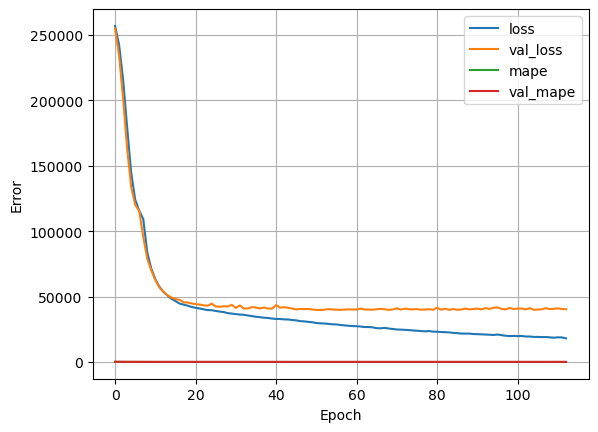

In [98]:
def plot_loss(history):
    plt.plot(history.history['loss'], label='loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.plot(history.history['mape'], label='mape')
    plt.plot(history.history['val_mape'], label='val_mape')
   # plt.ylim([0, 3])
    plt.xlabel('Epoch')
    plt.ylabel('Error')
    plt.legend()
    plt.grid(True)
plot_loss(history)

In [99]:
models.append(sequential_model)

### End tensorflow block

In [100]:
X_test_selected = pd.DataFrame(common_pipeline_ws.transform(X_test), columns=common_pipeline_ws.get_feature_names_out())
print(X_test_selected.shape)
X_test_selected

5528
(5528, 37)


,geo__make_distance__distance_to_center,geo__h3_features__h3_ar_sum,geo__h3_features__h3_ar_mean,geo__make_distance__distance_to_center^2,geo__h3_features__number_of_objects_in_cell h3_features__h3_ar_sum,geo__h3_features__number_of_objects_in_cell h3_features__h3_ar_mean,geo__h3_features__h3_ar_sum^2,geo__h3_features__h3_ar_sum h3_features__h3_ar_mean,geo__h3_features__h3_ar_mean^2,ohe__city_area_Didube District,...,num_tr_pw__space,num_tr_pw__floor,just__room,just__bedroom,just__latitude,just__longitude,just__max_floor,just__space,just__floor,remainder__furniture
0,0.530336,1.278030,1.444843,0.545588,1.516892,1.578827,1.278071,1.385007,1.446031,0.0,...,-1.379374,-0.389084,-0.901561,-0.965640,0.085140,1.289839,-0.532302,-1.087819,-0.546279,1.0
1,-0.544168,1.650236,1.437778,-0.549152,0.784320,0.730920,1.653137,1.563199,1.438838,0.0,...,-0.290877,1.670607,-0.901561,-0.965640,-0.198630,-0.734540,0.826942,-0.449085,2.059410,1.0
2,-0.784044,0.275720,0.181682,-0.801497,-0.063527,-0.105142,0.272843,0.221355,0.176299,0.0,...,-0.681386,0.170450,-0.901561,-0.965640,-0.172654,-0.475152,0.050231,-0.715224,-0.072517,1.0
3,1.407827,0.924371,0.795456,1.399119,0.384556,0.340702,0.922568,0.860032,0.789326,0.0,...,1.148172,0.607088,0.129354,0.260503,1.961516,-0.630387,-0.532302,1.094522,0.401244,0.0
4,-0.296369,-0.488120,-0.472689,-0.291107,-0.242305,-0.229975,-0.488399,-0.486289,-0.471136,0.0,...,0.645570,0.795072,0.129354,0.260503,-0.253850,-0.980328,1.021119,0.429174,0.638125,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5523,-1.212647,-0.834805,-0.973275,-1.250941,-0.792373,-0.851656,-0.832691,-0.900715,-0.965294,0.0,...,0.324955,0.400410,0.129354,0.260503,-0.786062,0.190883,-0.726480,0.083193,0.164364,1.0
5524,-1.819347,1.295710,1.129463,-1.789112,1.418476,1.336693,1.295865,1.221164,1.125991,0.0,...,1.350692,1.788078,1.160269,1.486645,-0.658718,-0.294609,1.215297,1.413889,2.296291,0.0
5525,-1.819347,1.295710,1.129463,-1.789112,1.418476,1.336693,1.295865,1.221164,1.125991,0.0,...,2.054719,-0.744962,2.191184,1.486645,-0.658718,-0.294609,0.244409,2.824427,-0.783160,0.0
5526,-1.473442,-0.055269,-0.148001,-1.509436,-0.190771,-0.233495,-0.057521,-0.108880,-0.150459,0.0,...,-0.152540,1.276229,0.129354,0.260503,-0.444683,-0.263929,1.021119,-0.342630,1.348768,0.0


In [101]:
model_dummy = DummyRegressor(strategy="median")
model_dummy.fit(X_train_selected, y_train)

models.append(model_dummy)

predict = model_dummy.predict(X_test_selected)
mean_absolute_percentage_error(predict, y_test)

0.519112360332459

In [102]:
models

[LinearRegression(),
 Lasso(alpha=4.723, random_state=1012),
 Ridge(alpha=4.432, random_state=1012, solver='cholesky'),
 SVR(C=100, degree=5, gamma=0.01, kernel='linear'),
 KNeighborsRegressor(algorithm='brute', leaf_size=200),
 DecisionTreeRegressor(max_depth=25, min_samples_leaf=7, min_samples_split=24,
                       random_state=1012),
 RandomForestRegressor(max_depth=41, min_samples_leaf=6, min_samples_split=17,
                       n_estimators=33, random_state=1012),
 LGBMRegressor(n_estimators=300, num_leaves=200, random_state=1012),
 XGBRegressor(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat

<a id='step_6'></a>
# Test of best model

In [103]:
# for compare I'll record time and few metrics (main metric is MAPE)

score_list = []
predictions_list = []
score_list_mape = []
score_list_std_ae = []
time_list = []
r2score_list = []
models_list = ['linear', 'lasso','ridge', 'svm', 'knn','tree','forest','lgbm','xgb', 'sequential','dummy']

for i in models:
    print(i)
    tic = time.time()
    predictions = i.predict(X_test_selected)
    predictions_list.append(predictions.reshape(len(predictions),))
    tac = time.time()
    time_int = tac - tic 

    score_list.append(mean_absolute_error(y_test, predictions))
    score_list_mape.append(mean_absolute_percentage_error(y_test, predictions))
    try:
        score_list_std_ae.append(np.std(abs(y_test - predictions)))
    except:
        score_list_std_ae.append(np.std(abs(y_test - predictions[0])))
    r2score_list.append(r2_score(y_test, predictions))
    time_list.append(time_int)


LinearRegression()
Lasso(alpha=4.723, random_state=1012)
Ridge(alpha=4.432, random_state=1012, solver='cholesky')
SVR(C=100, degree=5, gamma=0.01, kernel='linear')
KNeighborsRegressor(algorithm='brute', leaf_size=200)
DecisionTreeRegressor(max_depth=25, min_samples_leaf=7, min_samples_split=24,
                      random_state=1012)
RandomForestRegressor(max_depth=41, min_samples_leaf=6, min_samples_split=17,
                      n_estimators=33, random_state=1012)
LGBMRegressor(n_estimators=300, num_leaves=200, random_state=1012)
XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_

In [104]:
# table for compare results
pd.options.display.float_format = '{:,.4f}'.format  

table_mae = pd.DataFrame(data=[models, score_list, score_list_mape, score_list_std_ae, r2score_list, time_list], columns=models_list, index=['models','mae', 'mape', 'std_ae', 'r2score','speed_seconds'])
table_mae = table_mae.T
table_mae = table_mae.sort_values(by='mape', ascending=True)
table_mae['model'] = table_mae.index
table_mae.to_excel('table_compare.models.xlsx')
table_mae

,models,mae,mape,std_ae,r2score,speed_seconds,model
lgbm,"LGBMRegressor(n_estimators=300, num_leaves=200...","33,735.6101",0.1288,"46,909.7771",0.8624,0.0662,lgbm
xgb,"XGBRegressor(base_score=None, booster=None, ca...","34,808.4282",0.1338,"46,307.8802",0.8616,0.0205,xgb
sequential,<keras.src.engine.sequential.Sequential object...,"39,531.1174",0.1416,"148,665.9190",0.8095,0.2673,sequential
forest,"(DecisionTreeRegressor(max_depth=41, max_featu...","37,164.2344",0.1418,"48,830.4658",0.8447,0.0221,forest
tree,"DecisionTreeRegressor(max_depth=25, min_sample...","43,046.4469",0.1632,"56,031.5544",0.7942,0.0021,tree
knn,"KNeighborsRegressor(algorithm='brute', leaf_si...","43,368.8097",0.1699,"53,718.3428",0.8035,0.3429,knn
svm,"SVR(C=100, degree=5, gamma=0.01, kernel='linear')","49,594.7977",0.1887,"61,752.3592",0.7414,1.9809,svm
ridge,"Ridge(alpha=4.432, random_state=1012, solver='...","49,613.6524",0.2086,"55,730.9570",0.7705,0.0019,ridge
lasso,"Lasso(alpha=4.723, random_state=1012)","49,651.0514",0.2087,"55,769.7908",0.7701,0.0011,lasso
linear,LinearRegression(),"49,618.0240",0.2094,"55,583.9026",0.7711,0.0026,linear


In [105]:
# table of predictions from best model
table_predictions = pd.DataFrame(data=predictions_list, 
                                 index=models_list)

table_predictions = table_predictions.T
table_predictions = table_predictions.set_index(y_test.index)
table_predictions['true'] = y_test
table_predictions.head()

,linear,lasso,ridge,svm,knn,tree,forest,lgbm,xgb,sequential,dummy,true
18918,"123,085.2454","125,771.3007","125,642.5260","120,483.6551","115,100.0000","106,247.3684","120,669.0245","136,002.0957","129,922.5859","129,276.5156","214,200.0000",138400
20479,"272,591.7926","257,550.6057","260,319.1219","255,481.4059","272,180.0000","239,128.5714","283,853.3219","277,125.9200","276,548.1875","272,412.0625","214,200.0000",263600
9097,"222,423.8736","227,063.3099","226,419.1295","216,088.7553","202,320.0000","222,255.5556","209,122.2733","205,678.6135","213,021.1719","209,895.5781","214,200.0000",204300
1463,"295,434.8366","288,994.8826","291,279.7745","286,258.2639","265,580.0000","231,418.1818","232,274.0719","215,438.2886","203,685.3281","201,796.9219","214,200.0000",214200
22078,"357,117.3595","358,732.6023","358,562.4404","325,466.3191","293,000.0000","383,636.3636","359,833.4534","346,531.3333","369,085.0000","360,610.7500","214,200.0000",355900


In [106]:
best_modle_from_survey = table_mae['models'][0]
print(best_modle_from_survey)
best_model_name = list(table_mae['model'].iloc[:1])[0]
print(best_model_name)

LGBMRegressor(n_estimators=300, num_leaves=200, random_state=1012)
lgbm


In [107]:
# function for count error of prediction for each object
def error_prc(data):
    pred = data['true']
    true = data[best_model_name]
    error = data['error']
    if pred > true:
        return error/pred
    else:
        return error/true
table_predictions['error'] = abs(table_predictions['true'] - table_predictions[best_model_name])
table_predictions['error_prc'] = table_predictions.apply(error_prc, axis=1)

In [108]:
print(table_predictions['true'].max())

906200


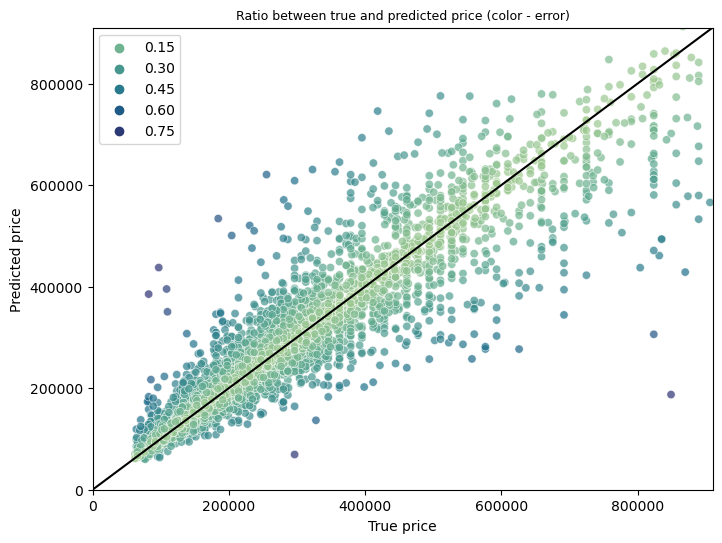

In [109]:
# Visualisation of the ration between true and predicted meanings
line = pd.DataFrame({'x':range(0,910000), 'y':range(0,910000)})

plt.figure(figsize=(8, 6)) 
sns.scatterplot(data = table_predictions, x='true', y=best_model_name, alpha=0.7, hue='error_prc', palette='crest')#, legend='auto') #,legend='auto')#, label=best_modle_name)
plt.legend(title='Error')
plt.legend(loc='upper right',bbox_to_anchor = (0,-1))
plt.xlim(0,910000)
plt.ylim(0,910000)
plt.ylabel('Predicted price')
plt.xlabel('True price')
sns.lineplot(data = line, x='x',y='y', c='black')
plt.title('Ratio between true and predicted price (color - error)', fontsize=9)
plt.savefig('02_Images/06_true-predictions_plot.png')
plt.show()

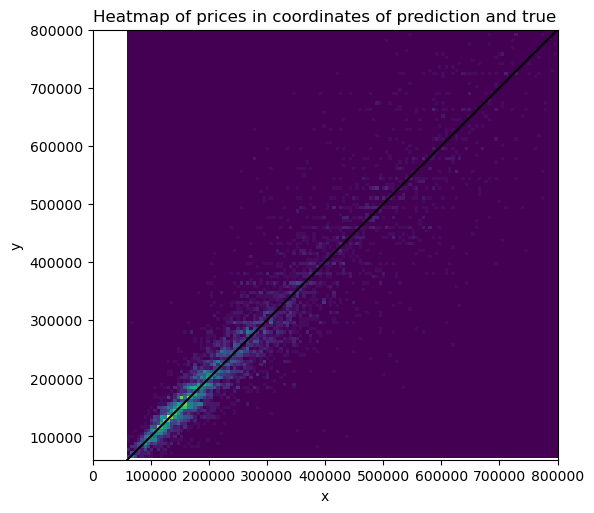

In [110]:
heatmap, xedges, yedges = np.histogram2d(table_predictions[best_model_name], table_predictions['true'], bins=150)
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

plt.figure(figsize=(6, 6))
plt.imshow(heatmap.T, extent=extent, origin='lower', cmap='viridis')
sns.lineplot(data = line.loc[line['y'] > 60000], x='x',y='y', c='black')
plt.ylim(60000, 800000)
plt.xlim(0,800000)
plt.title("Heatmap of prices in coordinates of prediction and true")
plt.savefig('02_Images/08_heatmap_prediction_and_true.png')
plt.show()

Model is less accurately in case of low price, but in case of middle price model make more strong errors  
Usually price predicted by model is higher than true price (not in case of highest prices, but there are only few meanings in that case)  
Real prices sometimes looking as rows (550000, 800000), predictons looking more clowdly

In [111]:
table_predictions2 = table_predictions.reset_index(drop=True)
print(table_predictions2.shape)
table_predictions2.head()

(5528, 14)


,linear,lasso,ridge,svm,knn,tree,forest,lgbm,xgb,sequential,dummy,true,error,error_prc
0,"123,085.2454","125,771.3007","125,642.5260","120,483.6551","115,100.0000","106,247.3684","120,669.0245","136,002.0957","129,922.5859","129,276.5156","214,200.0000",138400,"2,397.9043",0.0173
1,"272,591.7926","257,550.6057","260,319.1219","255,481.4059","272,180.0000","239,128.5714","283,853.3219","277,125.9200","276,548.1875","272,412.0625","214,200.0000",263600,"13,525.9200",0.0488
2,"222,423.8736","227,063.3099","226,419.1295","216,088.7553","202,320.0000","222,255.5556","209,122.2733","205,678.6135","213,021.1719","209,895.5781","214,200.0000",204300,"1,378.6135",0.0067
3,"295,434.8366","288,994.8826","291,279.7745","286,258.2639","265,580.0000","231,418.1818","232,274.0719","215,438.2886","203,685.3281","201,796.9219","214,200.0000",214200,"1,238.2886",0.0057
4,"357,117.3595","358,732.6023","358,562.4404","325,466.3191","293,000.0000","383,636.3636","359,833.4534","346,531.3333","369,085.0000","360,610.7500","214,200.0000",355900,"9,368.6667",0.0263


Next I want to make visualisation with histogramm and boxplot of predicted and true values of price to compare it

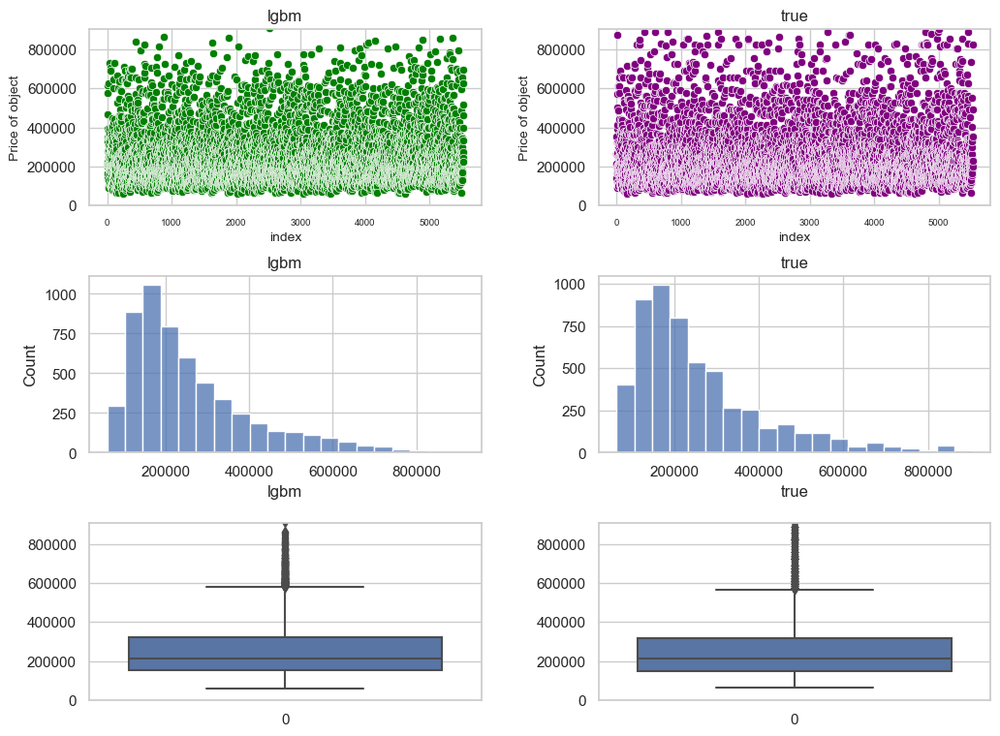

In [112]:
upper = table_predictions2['true'].max() + 5

plt.figure(figsize=(12, 9)) 
sns.set(context = 'notebook', style = 'whitegrid', font_scale=1)                      


plt.subplot(3, 2, 1)                            
sns.scatterplot(data = table_predictions2, x=table_predictions2.index, y=best_model_name, alpha=1, color='green') #label=best_modle_name)
plt.xlabel('index', fontsize=10)
plt.xticks(fontsize = 7, position = (-0.03, 0))#, rotation = 60) 
plt.ylim(0,upper)
plt.ylabel('Price of object', fontsize=10)
plt.title(best_model_name)


plt.subplot(3, 2, 2)                            
sns.scatterplot(data = table_predictions2, x=table_predictions2.index, y='true', alpha=1,  color='purple') #label='true')
plt.xlabel('index', fontsize=10)
plt.ylim(0,upper)
plt.ylabel('Price of object', fontsize=10)
plt.xticks(fontsize = 7, position = (-0.03, 0))#, rotation = 60) 
plt.title('true')

plt.subplot(3, 2, 3)    
sns.histplot(table_predictions2[best_model_name], bins=20)
#plt.ylim(0,upper)
plt.title(best_model_name)

plt.subplot(3, 2, 4)    
sns.histplot(table_predictions2['true'], bins=20)
#plt.ylim(0,upper)
plt.title('true')


plt.subplot(3, 2, 5)  
sns.boxplot(table_predictions2[best_model_name])  
plt.ylim(0,upper)

plt.subplot(3, 2, 6)    
sns.boxplot(table_predictions2['true'])
plt.ylim(0,upper)


#plt.legend(bbox_to_anchor = (1,1))
plt.subplots_adjust(hspace = 0.4) 
plt.subplots_adjust(wspace = 0.3) 
plt.show()

Plots are similar (boxplots more similar) but it is obviuos that model worse in prediction of low price (It is vivble on histogramm, and it was visible on plot with ratio of predicted and true values)

## Feature importance

[3.79093605e+02 3.54500868e+02 2.72124396e+02 2.38342638e+02
 1.91205550e+02 1.43161868e+02 1.29386140e+02 1.24619422e+02
 1.11294207e+02 1.00115897e+02 7.75057093e+01 6.78493958e+01
 6.01724111e+01 5.54429286e+01 5.28200145e+01 4.46046566e+01
 4.31303121e+01 3.94817438e+01 3.86074020e+01 3.51946754e+01
 3.41013715e+01 3.04107549e+01 2.95684847e+01 2.52707214e+01
 2.15436341e+01 1.71553563e+01 1.40954512e+01 1.33936349e+01
 7.65802852e+00 2.27972604e+00 2.12267064e+00 1.69194262e+00
 1.16877124e+00 5.77164748e-01 4.62051403e-01 2.44251423e-01
 5.65955352e-13]


<Axes: xlabel='cols', ylabel='values'>

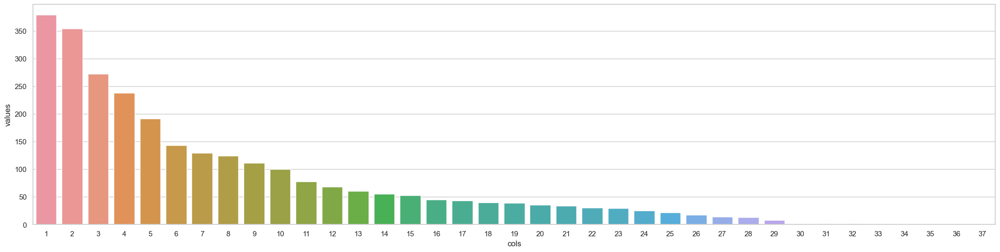

In [113]:
# looking for importance of cols during dimension reduction
n_cols = X_train_selected.shape[1]
pca = PCA(n_cols, random_state=42).fit(X_train_selected.T)
print(pca.singular_values_)


bp = pd.DataFrame({'values': pca.singular_values_, 'cols': range(1, n_cols+1)})
#sns.barplot(pca.singular_values_)
plt.figure(figsize=(26, 6)) 
sns.set(context = 'notebook', style = 'whitegrid', font_scale=1)   
sns.barplot(data=bp, x='cols', y='values')

lgbm
LGBMRegressor(n_estimators=300, num_leaves=200, random_state=1012)
lgbm Feature importance plot
Just dummy


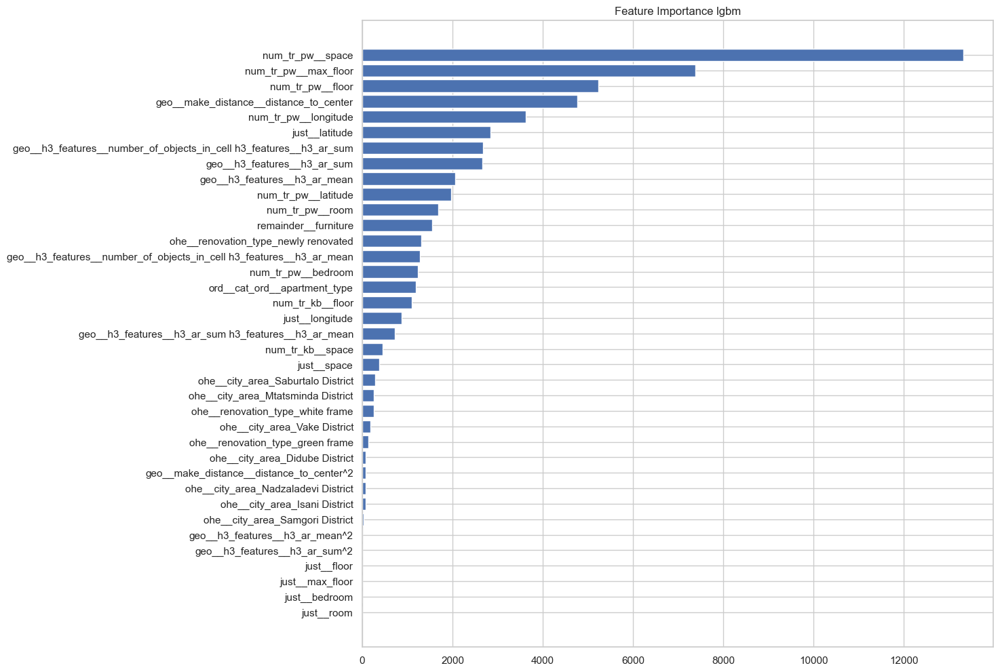

In [114]:
# visualsiation of feature importance for best model (feature_importance if possible, linear coeffs for linear models and permutational importance for others)

print(best_model_name)
print(best_modle_from_survey)

if best_model_name in ['linear', 'ridge' ,'lasso']:
    print(best_model_name, 'Coeffs for linear model')
    coefs = pd.DataFrame(
                        {"Coefficients": np.abs(best_modle_from_survey.coef_.reshape(len(X_train_selected.columns),))}, index=X_train_selected.columns
                        ).sort_values(by='Coefficients')
    coefs.plot(kind="barh", figsize=(9, 12))
    plt.title('Coefficients ' + str(best_model_name) + ' model')
    plt.savefig('02_Images/07_feature_importance_plot.png')
        
if best_model_name in ['tree', 'forest' ,'lgbm','xgb']:
    print(best_model_name, 'Feature importance plot')
    feature_importance = best_modle_from_survey.feature_importances_
    sorted_idx = np.argsort(feature_importance)
    fig = plt.figure(figsize=(12, 12))
    plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
    plt.yticks(range(len(sorted_idx)), np.array(X_test_selected.columns)[sorted_idx])
    plt.title('Feature Importance ' + str(best_model_name))
    plt.savefig('02_Images/07_feature_importance_plot.png')

if best_model_name in ['svm', 'sequential' ,'knn']:
    print(best_model_name, 'Permutational importance process')
    result = permutation_importance(best_modle_from_survey, X_train_selected, y_train, n_repeats=10, random_state=42, scoring='neg_mean_absolute_error')
    # Display results
    #for i in result.importances_mean.argsort()[::-1]:
    #    print(f"{X_train_selected.columns[i]}: {result.importances_mean[i]:.3f} +/- {result.importances_std[i]:.3f}")

    df = pd.DataFrame({'feature':X_train_selected.columns, 'importances_mean': result['importances_mean']})
    df = df.sort_values(by='importances_mean', ascending=False)
    df
    sns.barplot(data=df, x='importances_mean', y='feature', color='b')
    plt.title('Permutational feature Importance ' + str(best_model_name))
    plt.savefig('02_Images/07_feature_importance_plot.png')
else:
    print('Just dummy')

Space (modifed with PowerTransformer) most important featue (according LightGBM feature importance)
Max floor is second by importance, three other important features are lat, lon, and distance to center

<a id='step_7'></a>
# Exampe for production

Finally I make all process of this task in one cell (for example to use it in production mode or in one .py file). Here I modified classes for preprocessing, and add one separate pipeline for first stage of preprocessing (clean outliers, drop Nones, rename categories, drop geographical anomalies and obtain geometry and h3 indexes). In this cell I save pipelines to use it one time more in another separate cell.

In [117]:
import geopandas as gpd
import joblib
import h3
import lightgbm as lgb  
import numpy as np
import pandas as pd

from lightgbm import LGBMRegressor   
from scipy.stats import iqr
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectKBest, f_classif  
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, PolynomialFeatures, KBinsDiscretizer, OrdinalEncoder, StandardScaler, PowerTransformer

SEED = 1012
np.random.seed(SEED)


class FirstCleaner(BaseEstimator, TransformerMixin):
    def transform(self, X):
        X = X.drop('Unnamed: 0',axis=1)
        for col in ['price', 'space', 'floor', 'max_floor']:
            lower = X[col].quantile(0.25) - 3 * iqr(X[col])
            upper = X[col].quantile(0.75) + 3 * iqr(X[col])
            X = X.loc[X[col] > lower]
            X = X.loc[X[col] < upper]
        X = X.loc[X['price'] > 60000]

        def renovation_type_correction(data):
            apartment_type = data['apartment_type']
            renovation_type = data['renovation_type']
            if apartment_type == 'construction' and renovation_type in ['under renovation', 'not renovated', 'old renovation']:
                return 'black frame'
            if apartment_type == 'new' and renovation_type == 'not renovated':
                return 'black frame'
            if apartment_type == 'new' and renovation_type == 'under renovation':
                return 'white frame'
            if apartment_type == 'old' and renovation_type in ['black frame', 'white frame', 'green frame']:
                return 'under renovation'
            else:
                return renovation_type
        
        X['renovation_type'] = X.apply(renovation_type_correction, axis=1)

        tbs = gpd.read_file('../tbs_housing_data/BNDA_GEO_2000-01-01_lastupdate.geojson')
        tbs = tbs[tbs.adm1nm == 'Tbilisi (City)']
        lake = gpd.read_file('../tbs_housing_data/tbilisi_tsalsakavi.geojson')
        X = gpd.GeoDataFrame(X, geometry=gpd.points_from_xy(X.longitude, X.latitude), crs="EPSG:4326")
        X = gpd.overlay(X, tbs, how='intersection')
        X = gpd.overlay(X, lake, how='difference')
        X = X[['price', 'space', 'room', 'bedroom', 'furniture', 'latitude', 'longitude', 
                     'city_area', 'floor', 'max_floor', 'apartment_type',
                     'renovation_type', 'balcony', 'geometry']]
        X = X.dropna()

        RES_H3 = 9

        def convert_to_h3(lat, lon, res):
            h3_index = h3.geo_to_h3(lat, lon, res) # different functions in different versions, also latlng_to_cell
            return h3_index

        def h3_to_table(row):
            lat = row['latitude']
            lon = row['longitude']
            h3_index = convert_to_h3(lat, lon, RES_H3)
            return h3_index

        X['h3'] = X.apply(h3_to_table, axis=1)

        self.feature_names_out_ = X.columns.to_list()
        return X
    
    def fit(self, X, y=None):
        return self

    def get_feature_names_out(self, input_features=None):
        return self.feature_names_out_


class CalcDistanceTransformer(BaseEstimator, TransformerMixin):
    def transform(self, X):
        center_point = pd.DataFrame({'place':'mrgvali_baghi', 'lat': [41.707391], 'lon' :[44.775083]})
        center_point = gpd.GeoDataFrame(center_point, geometry=gpd.points_from_xy(center_point.lon, center_point.lat), crs="EPSG:4326")
        X = X.to_crs(3857)
        center_point = center_point.to_crs(3857)
        X['distance_to_center'] = X['geometry'].apply(lambda x: x.distance(center_point['geometry'].iloc[0]) / 1000)
        print(X['distance_to_center'].shape[0])
   
        return np.array(X['distance_to_center']).reshape(X['distance_to_center'].shape[0],1)

    def fit(self, X, y=None):
        return self

    def get_feature_names_out(self, input_features=None):
        return ["distance_to_center"]
    
class H3FeaturesTransformer(BaseEstimator, TransformerMixin):

    def transform(self, X):
        
        X['id'] = X.index
        group_dict = {'id':'count'}
        grouped = X.groupby(['h3']).agg(group_dict)
        grouped.columns = ['number_of_objects_in_cell']
        grouped = grouped.reset_index()

        sum_list = []
        mean_list = []
        for a in grouped['h3']:
            indexes = h3.k_ring(a, 1)
            sum_list.append(grouped.query('h3 in @indexes')['number_of_objects_in_cell'].sum())
            mean_list.append(grouped.query('h3 in @indexes')['number_of_objects_in_cell'].mean())
        grouped['h3_ar_sum'] = pd.Series(sum_list)
        grouped['h3_ar_mean'] = pd.Series(mean_list)
        X = X.merge(grouped[['h3', 'number_of_objects_in_cell','h3_ar_sum','h3_ar_mean']], on='h3', how='left')
        return np.array(X[['number_of_objects_in_cell','h3_ar_sum','h3_ar_mean']]) #.reshape(X['distance_to_center'].shape[0],1)

    def fit(self, X, y=None):
        return self

    def get_feature_names_out(self, input_features=None):
        return ['number_of_objects_in_cell','h3_ar_sum','h3_ar_mean']
    
# here is pipline for ordinal features
preprocessor_ord = ColumnTransformer([
    ('cat_ord', OrdinalEncoder(categories = [['construction','old','new']]), ['apartment_type'])])

pipeline_ord = Pipeline(steps=[
    ('ord', preprocessor_ord),  
    ('scaler', StandardScaler())  
])

# here pipeline for geographic features, I add PolynomialFeaturesTransformer for them
preprocessor_geo = ColumnTransformer([
    ("make_distance", CalcDistanceTransformer(), ["geometry"]),
    ('h3_features', H3FeaturesTransformer(), ['h3'])])

pipeline_geo = Pipeline(steps=[
    ('geo', preprocessor_geo),  
    ('poly', PolynomialFeatures(degree=2, include_bias=False)),
    ('pwr', PowerTransformer(method='yeo-johnson')), # var 2
    ('scaler', StandardScaler())  
])

# here pipelines for cols_for_k_bins_and_power
# KBinsDiscretizer
binned_transformer = Pipeline(steps=[
    ('kbins', KBinsDiscretizer(n_bins=5, encode='ordinal', strategy='uniform', subsample=None)),
    ('scaler', StandardScaler())  
])

# PowerTransformer
power_transformer = Pipeline(steps=[
    ('pwr', PowerTransformer(method='yeo-johnson')),
    ('scaler', StandardScaler())  
])

# Columns lists for common_preprocesor (preprocessing before ML)
cols_for_ohe = ['city_area', 'renovation_type']
cols_for_geographic_features_with_polynomial = ["geometry", 'h3'] 
cols_for_ordinal = ['apartment_type']
cols_for_just_scaling = ['room', 'bedroom', 'latitude','longitude','max_floor','space','floor'] 
cols_for_k_bins_and_power = ['space','floor']

common_preprocessor = ColumnTransformer([
    ("geo", pipeline_geo, cols_for_geographic_features_with_polynomial),
    ('ohe', OneHotEncoder(drop='first',sparse_output=False), cols_for_ohe),
    ('ord', pipeline_ord, cols_for_ordinal),
    ('num_tr_kb', binned_transformer, cols_for_k_bins_and_power),
    ('num_tr_pw', power_transformer, cols_for_just_scaling), # var 2
    ('just', StandardScaler(), cols_for_just_scaling)
], remainder='passthrough'
)

# pipeline for first preprocessing It uses separately because here I need to modify target feature too
cleaner_pipe = Pipeline([
    ("preprocess", FirstCleaner()),
])

# pipeline for preprocessing before ML, feature selection and model fitting
common_pipeline_ws = Pipeline([
    ("preprocess", common_preprocessor),
    ('selection', SelectKBest(f_classif, k=37)), # var 2
    ('model', LGBMRegressor(n_estimators=300, num_leaves=200, random_state=SEED))
])

data2 = pd.read_csv('01_support_files/housing_clean_2.csv')
data2 = cleaner_pipe.fit_transform(data2)

X = data2.drop(['price'], axis=1)
y = data2['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=SEED)

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

common_pipeline_ws.fit(X_train, y_train)
print('MAPE:', mean_absolute_percentage_error(common_pipeline_ws.predict(X_test), y_test))

with open('03_Pipelines/01_preprocessing.pkl', 'wb') as fd:
        joblib.dump(cleaner_pipe, fd) 

with open('03_Pipelines/02_main_pipeline.pkl', 'wb') as fd:
        joblib.dump(common_pipeline_ws, fd) 

(22108, 14)
(22108,)
(5528, 14)
(5528,)
22108
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000415 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3448
[LightGBM] [Info] Number of data points in the train set: 22108, number of used features: 37
[LightGBM] [Info] Start training from score 260137.665099
5528
MAPE: 0.13799502190936516


Final cell with opening saved pipelines and data and using them

In [118]:
import geopandas as gpd
import joblib
import h3
import lightgbm as lgb  
import numpy as np
import pandas as pd

from lightgbm import LGBMRegressor   
from scipy.stats import iqr
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer
from sklearn.feature_selection import SelectKBest, f_classif  
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, PolynomialFeatures, KBinsDiscretizer, OrdinalEncoder, StandardScaler, PowerTransformer

SEED = 1012
np.random.seed(SEED)

a = joblib.load('03_Pipelines/01_preprocessing.pkl')
b = joblib.load('03_Pipelines/02_main_pipeline.pkl')
data2 = pd.read_csv('01_support_files/housing_clean_2.csv')
data2 = a.fit_transform(data2)
SEED = 1012
X = data2.drop(['price'], axis=1)
y = data2['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=SEED)
b.fit(X_train, y_train)
print(mean_absolute_percentage_error(b.predict(X_test), y_test))

22108
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000376 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3448
[LightGBM] [Info] Number of data points in the train set: 22108, number of used features: 37
[LightGBM] [Info] Start training from score 260137.665099
5528
0.13799502190936516
